<a href="https://colab.research.google.com/github/Rinita1503/HandsonML/blob/main/SIR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from datetime import datetime
time_format = "%d%b%Y %H:%M"
datetime.now().strftime(time_format)

'08Aug2021 18:32'

In [2]:
!python --version

Python 3.7.11


In [3]:
# Remove third-party typing package from Kaggle environment, if necessary (Python <3.7.9)
# https://lisphilar.github.io/covid19-sir/INSTALLATION.html
# !pip uninstall typing -y
# Development version in GitHub
!pip install --upgrade "git+https://github.com/lisphilar/covid19-sir.git#egg=covsirphy"
# Stable version in PyPI
# !pip install --upgrade covsirphy

  Cloning https://github.com/lisphilar/covid19-sir.git to /tmp/pip-install-ynh4291y/covsirphy_343ecc407c72451e97fdbae55eee43dd
  Running command git clone -q https://github.com/lisphilar/covid19-sir.git /tmp/pip-install-ynh4291y/covsirphy_343ecc407c72451e97fdbae55eee43dd
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 49 kB 2.7 MB/s 
     |████████████████████████████████| 167 kB 9.7 MB/s 
     |████████████████████████████████| 241 kB 38.9 MB/s 
     |████████████████████████████████| 22.3 MB 1.7 MB/s 
     |████████████████████████████████| 918 kB 37.2 MB/s 
     |████████████████████████████████| 62 kB 734 kB/s 
     |████████████████████████████████| 302 kB 61.6 MB/s 
     |████████████████████████████████| 994 kB 62.2 MB/s 
     |████████████████████████████████| 2.0 MB 38.9 MB/s 
     |████████████████████████████████| 15.4 MB 36 kB/s 
     |██████████████████████

In [4]:
import covsirphy as cs
cs.__version__

'2.22.0-alpha'

In [5]:
!pip install openpyxl

In [7]:
!python -m pip install dask[dataframe] --upgrade
from collections import defaultdict
from datetime import timedelta
from dateutil.relativedelta import relativedelta
import functools
from IPython.display import display, Markdown
import math
import os
from pprint import pprint
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
from matplotlib.ticker import ScalarFormatter
%matplotlib inline
import numpy as np
import pandas as pd
import dask.dataframe as dd
pd.plotting.register_matplotlib_converters()
import seaborn as sns
import scipy as sci
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import sympy as sym


     |████████████████████████████████| 118 kB 5.3 MB/s 


In [8]:
# Ramdam
np.random.seed(123)
os.environ["PYTHONHASHSEED"] = "123"
# Matplotlib
plt.style.use("seaborn-ticks")
plt.rcParams["xtick.direction"] = "in"
plt.rcParams["ytick.direction"] = "in"
plt.rcParams["font.size"] = 11.0
plt.rcParams["figure.figsize"] = (9, 6)
# Pandas
pd.set_option("display.max_colwidth", 1000)

In [9]:
# Create instance of covsirphy.DataLoader class
data_loader = cs.DataLoader(directory="kaggle/input")
# Retrieve the dataset of the number of COVID-19 cases
# Kaggle platform: covid19dh.csv will be saved in /output/kaggle/working/input
# Local env: covid19dh.csv will be saved in kaggle/input
jhu_data = data_loader.jhu()

Retrieving COVID-19 dataset in Japan from https://github.com/lisphilar/covid19-sir/data/japan
Retrieving datasets from COVID-19 Data Hub https://covid19datahub.io/
	Please set verbose=2 to see the detailed citation list.
Retrieving datasets from Our World In Data https://github.com/owid/covid-19-data/
Retrieving datasets from COVID-19 Open Data by Google Cloud Platform https://github.com/GoogleCloudPlatform/covid-19-open-data


In [10]:
jhu_data.cleaned().tail()

,Date,ISO3,Country,Province,Confirmed,Infected,Fatal,Recovered,Population
793997,2021-08-03,CHN,China,-,105346,1311,4848,99187,1361142636
793998,2021-08-04,CHN,China,-,105433,1357,4848,99228,1361142636
793999,2021-08-05,CHN,China,-,105563,1487,4848,99228,1361142636
794000,2021-08-06,CHN,China,-,105672,1596,4848,99228,1361142636
794001,2021-08-07,CHN,China,-,105775,1699,4848,99228,1361142636


In [11]:
jhu_data.subset("Japan", province=None).tail()

,Date,Confirmed,Infected,Fatal,Recovered,Susceptible
545,2021-08-04,956407,88581,15219,852607,125572693
546,2021-08-05,970460,96771,15228,858461,125558640
547,2021-08-06,985690,105675,15240,864775,125543410
548,2021-08-07,1001281,112507,15255,873519,125527819
549,2021-08-08,1016781,119900,15273,881608,125512319


In [12]:
df = jhu_data.cleaned()
jhu_first_date, jhu_last_date = df["Date"].min(), df["Date"].max()
jhu_elapsed = (jhu_last_date - jhu_first_date).days
print(f"{jhu_elapsed} days have passed from the date of the first record.")

950 days have passed from the date of the first record.


In [13]:
pyramid_data = data_loader.pyramid()

In [14]:
# @marcoferrante estimation
_period_of_life_list = [
    "nursery", "nursery school", "elementary school", "middle school",
    "high school", "university/work", "work", "work", "work", "work",
    "retired", "retired", "retired"
]
df = pd.DataFrame(
    {
        "Age_first": [0, 3, 6, 11, 14, 19, 26, 36, 46, 56, 66, 76, 86],
        "Age_last": [2, 5, 10, 13, 18, 25, 35, 45, 55, 65, 75, 85, 95],
        "Period_of_life": _period_of_life_list,
        "Days": [3, 5, 6, 6, 7, 7, 6, 5, 5, 5, 4, 3, 2]
    }
)
# Adjustment by author
df["Types"] = df["Period_of_life"].replace(
    {
        "nursery": "school",
        "nursery school": "school",
        "elementary school": "school",
        "middle school": "school",
        "high school": "school",
        "university/work": "school/work"
    }
)
df["School"] = df[["Types", "Days"]].apply(lambda x: x[1] if "school" in x[0] else 0, axis=1)
df["Office"] = df[["Types", "Days"]].apply(lambda x: x[1] if "work" in x[0] else 0, axis=1)
df["Others"] = df["Days"] - df[["School", "Office"]].sum(axis=1)
df.loc[df["Others"] < 0, "Others"] = 0
df.loc[df.index[1:5], "School"] -= 1
df.loc[df.index[1:5], "Others"] += 1
df.loc[df.index[5], ["School", "Office", "Others"]] = [3, 3, 1]
df[["School", "Office", "Others"]] = df[["Days", "School", "Office", "Others"]].apply(
    lambda x: x[1:] / sum(x[1:]) * x[0], axis=1
).astype(np.int64)
df.loc[df.index[6:10], "Others"] += 1
df = df.drop(["Days", "Types"], axis=1)
# Show dataset
_out_df = df.copy()
_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others
0,0,2,nursery,3,0,0
1,3,5,nursery school,4,0,1
2,6,10,elementary school,5,0,1
3,11,13,middle school,5,0,1
4,14,18,high school,6,0,1
5,19,25,university/work,3,3,1
6,26,35,work,0,6,1
7,36,45,work,0,5,1
8,46,55,work,0,5,1
9,56,65,work,0,5,1


In [15]:
def go_out(country, pyramid_data=pyramid_data):
    """
    Return the estimated number of days people usually go out.
    Args:
        country (str): coutry name
        pyramid_data (covsirphy.PopulationPyramidData): pyramid dataset
    
    Returns:
        pandas.DataFrame
    """
    p_df = pyramid_data.subset(country)
    p_df["Cumsum"] = p_df["Population"].cumsum()
    df = pd.merge(_out_df, p_df, left_on="Age_last", right_on="Age", how="left")
    df["Population"] = df["Cumsum"].diff()
    df.loc[df.index[0], "Population"] = df.loc[df.index[0], "Cumsum"]
    df["Population"] = df["Population"].astype(np.int64)
    df["Portion"] = df["Population"] / df["Population"].sum()
    return df.drop(["Per_total", "Cumsum"], axis=1)

go_out("Italy")

Retrieving population pyramid dataset (Italy) from https://data.worldbank.org/


,Age_first,Age_last,Period_of_life,School,Office,Others,Age,Population,Portion
0,0,2,nursery,3,0,0,2,1373871,0.025722
1,3,5,nursery school,4,0,1,5,1441955,0.026997
2,6,10,elementary school,5,0,1,10,2667055,0.049933
3,11,13,middle school,5,0,1,13,1688673,0.031616
4,14,18,high school,6,0,1,18,2829215,0.052969
5,19,25,university/work,3,3,1,25,4087599,0.076529
6,26,35,work,0,6,1,35,6521421,0.122096
7,36,45,work,0,5,1,45,7940871,0.148671
8,46,55,work,0,5,1,55,9560703,0.178998
9,56,65,work,0,5,1,65,8261046,0.154666


In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
ita_action_raw = pd.read_csv('/content/kaggle/input/wbdata_population_pyramid.csv')
ita_action_raw.head()

,Country,Year,Sex,Age,Population
0,Italy,2020,Male,0,235862
1,Italy,2020,Male,1,235862
2,Italy,2020,Male,2,235862
3,Italy,2020,Male,3,235862
4,Italy,2020,Male,4,235862


In [21]:
df = ita_action_raw.copy()
df = df.drop(["Country"], axis=1)
df.columns = [col.capitalize().replace(" ", "_") for col in df.columns]
#df["Start_date"] = pd.to_datetime(df["Start_date"])
#df["End_date"] = pd.to_datetime(df["End_date"])
#df["Region"] = df["Region"].fillna("-")
#df["Number_of_people"] = df["Number_of_people"].fillna(-1)
ita_action_df = df.copy()
ita_action_df.tail()

,Year,Sex,Age,Population
14391,1960,Female,118,9356
14392,1960,Female,119,9356
14393,1960,Female,120,9356
14394,1960,Female,121,9356
14395,1960,Female,122,9356


In [22]:
data_cols = ["Infected", "Fatal", "Recovered"]
rate_cols = ["Fatal per Confirmed", "Recovered per Confirmed", "Fatal per (Fatal or Recovered)"]

In [23]:
total_df = jhu_data.total()
total_df = total_df.loc[total_df.index <= jhu_last_date, :]
total_df.tail()

,Confirmed,Infected,Fatal,Recovered,Fatal per Confirmed,Recovered per Confirmed,Fatal per (Fatal or Recovered)
Date,,,,,,,
2021-08-04,199882484,58698994,4254689,136928801,0.021286,0.685047,0.030136
2021-08-05,200544146,58949493,4264987,137329666,0.021267,0.684785,0.030121
2021-08-06,201338010,59665869,4274769,137397372,0.021232,0.682421,0.030174
2021-08-07,201853072,60095159,4282762,137475151,0.021217,0.681065,0.030212
2021-08-08,50777592,16002625,1147870,33627097,0.022606,0.662243,0.033009


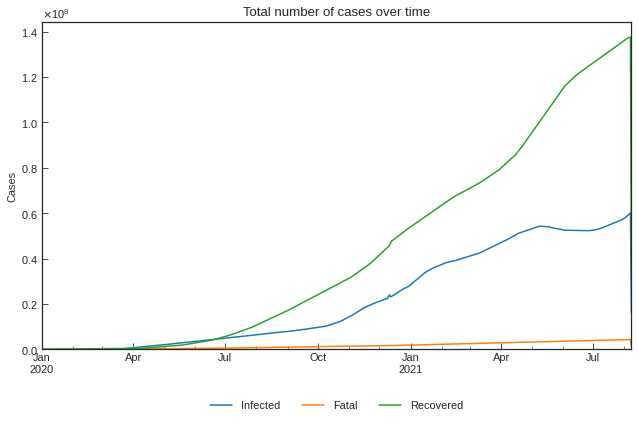

In [24]:
cs.line_plot(total_df[data_cols], "Total number of cases over time")

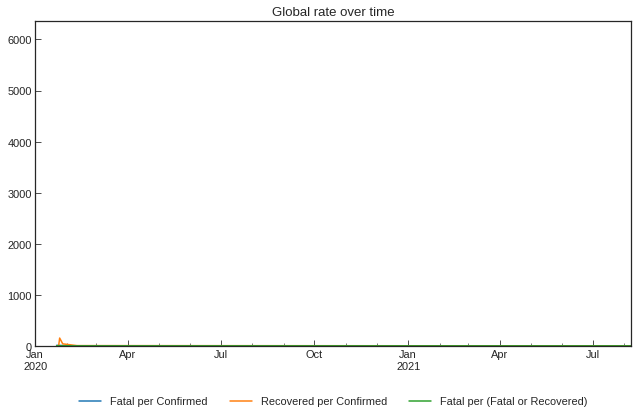

In [25]:
cs.line_plot(total_df[rate_cols], "Global rate over time", ylabel="", math_scale=False)

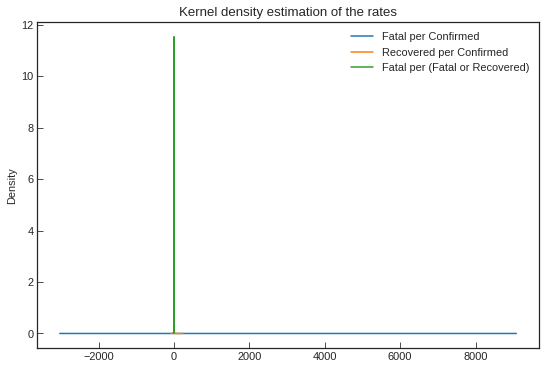

In [26]:
total_df[rate_cols].plot.kde()
plt.title("Kernel density estimation of the rates")
plt.show()

In [27]:
total_df[rate_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
Fatal per Confirmed,566.0,10.826779,254.464299,0.020783,0.021775,0.026179,0.048266,6054.000000
Recovered per Confirmed,566.0,1.686028,8.824277,0.044539,0.602764,0.638041,0.683703,153.326147
Fatal per (Fatal or Recovered),566.0,0.065824,0.091913,0.011222,0.033197,0.035725,0.059389,0.999835


In [28]:
covid_df = jhu_data.cleaned()
df = covid_df.pivot_table(
    index="Date", columns="Country", values="Confirmed", aggfunc="sum"
).fillna(method="ffill").fillna(0)
# Growth factor: (delta Number_n) / (delta Number_n)
df = df.diff() / df.diff().shift(freq="D")
df = df.replace(np.inf, np.nan).fillna(1.0)
# Rolling mean (window: 7 days)
df = df.rolling(7).mean().dropna().loc[:covid_df["Date"].max(), :]
# round: 0.01
growth_value_df = df.round(2)
growth_value_df.tail()

Country,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bermuda,Bhutan,Bolivia,Bonaire Sint Eustatius and Saba,Bosnia and Herzegovina,Botswana,Brazil,British Virgin Islands,Brunei,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Cape Verde,Cayman Islands,Central African Republic,...,South Sudan,Spain,Sri Lanka,St. Kitts and Nevis,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Timor,Timor-Leste,Togo,Tonga,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Turks and Caicos Islands,Tuvalu,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,"Virgin Islands, U.S.",Wallis and Futuna,Yemen,Zambia,Zimbabwe
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-07-26,0.51,1.32,1.04,1.0,0.52,1.15,1.0,0.57,1.04,1.10,1.0,1.05,1.02,1.15,1.27,1.13,1.12,1.10,1.03,1.24,0.72,0.86,0.71,2.11,0.55,1.0,1.70,0.71,1.25,1.0,1.05,1.31,0.71,1.29,1.00,0.76,1.11,0.98,1.0,0.86,...,1.00,1.67,1.05,1.0,0.86,1.21,1.33,60.42,0.91,1.18,60.64,1.00,1.00,1.04,1.0,1.17,0.85,1.0,1.02,1.07,1.0,1.0,1.0,1.0,1.04,1.04,1.0,0.93,1.76,1.0,1.01,1.03,1.0,0.60,1.04,0.94,1.0,0.92,0.98,1.22
2021-07-27,0.60,1.04,1.03,1.0,0.50,1.27,1.0,0.71,1.06,1.03,1.0,1.08,1.08,1.15,1.24,1.14,1.13,0.91,1.01,1.22,0.65,0.86,0.71,1.97,0.69,1.0,1.61,0.71,1.27,1.0,0.90,1.27,0.64,1.22,0.98,0.62,1.11,0.94,1.0,0.71,...,0.86,1.67,1.05,1.0,1.00,1.40,1.16,60.41,0.92,1.24,59.41,1.08,1.00,1.03,1.0,1.63,1.05,1.0,1.04,0.77,1.0,1.0,1.0,1.0,0.94,1.04,1.0,0.92,1.76,1.0,0.99,1.03,1.0,0.74,1.16,1.09,1.0,0.94,1.05,1.16
2021-07-28,0.71,1.10,1.07,1.0,0.50,1.22,1.0,0.57,1.06,1.09,1.0,1.05,1.04,1.25,0.71,1.18,1.19,0.96,1.04,1.32,0.63,0.86,0.71,1.98,0.63,1.0,1.80,0.71,1.17,1.0,1.05,1.33,0.74,1.20,0.99,0.62,1.14,1.03,1.0,0.86,...,0.86,1.66,1.06,1.0,1.00,1.44,1.24,60.39,0.90,1.27,59.60,1.04,1.00,1.04,1.0,2.13,1.13,1.0,1.11,1.10,1.0,1.0,1.0,1.0,1.46,1.04,1.0,0.94,1.73,1.0,1.00,1.03,1.0,0.73,1.10,1.08,1.0,0.87,1.06,1.17
2021-07-29,0.68,1.11,1.04,1.0,0.50,1.23,1.0,0.57,1.06,1.06,1.0,1.08,1.05,1.24,0.78,1.05,1.26,0.75,1.04,1.12,0.63,0.71,0.71,2.41,0.73,1.0,0.84,0.71,1.17,1.0,1.05,1.31,0.81,1.29,0.99,0.62,1.10,0.92,1.0,0.86,...,0.86,1.65,1.09,1.0,1.00,1.39,1.31,60.41,0.89,1.22,56.16,1.03,1.00,1.04,1.0,2.19,1.31,1.0,1.11,0.93,1.0,1.0,1.0,1.0,1.42,1.05,1.0,0.97,1.74,1.0,0.98,1.03,1.0,0.76,1.13,1.07,1.0,1.19,1.10,1.20
2021-07-30,0.80,1.10,1.03,1.0,0.49,1.17,1.0,0.73,1.03,1.09,1.0,1.04,1.08,1.14,0.85,1.04,1.14,2.66,1.05,1.14,0.66,0.86,0.71,1.61,0.58,1.0,0.85,0.71,0.99,1.0,1.14,1.36,0.83,0.78,0.97,0.71,1.09,1.07,1.0,0.71,...,0.86,1.65,1.13,1.0,1.00,1.29,1.20,60.44,0.91,1.18,-3.49,1.02,0.86,1.03,1.0,1.88,1.28,1.0,1.20,1.07,1.0,1.0,1.0,1.0,1.51,1.05,1.0,0.98,1.76,1.0,0.99,1.03,1.0,0.92,1.07,1.51,1.0,1.27,1.18,1.19


In [29]:
df = growth_value_df.copy()
df = df.iloc[-7:, :].T
day_cols = df.columns.strftime("%d%b%Y")
df.columns = day_cols
last_date = day_cols[-1]
# Grouping
more_col, less_col = "GF > 1 [straight days]", "GF < 1 [straight days]"
df[more_col] = (growth_value_df > 1).iloc[::-1].cumprod().sum(axis=0)
df[less_col] = (growth_value_df < 1).iloc[::-1].cumprod().sum(axis=0)
df["Group"] = df[[more_col, less_col]].apply(
    lambda x: "Outbreaking" if x[0] >= 7 else "Stopping" if x[1] >= 7 else "Crossroad",
    axis=1
)
# Sorting
df = df.loc[:, ["Group", more_col, less_col, *day_cols]]
df = df.sort_values(["Group", more_col, less_col], ascending=False)
growth_df = df.copy()
growth_df.head()

Date,Group,GF > 1 [straight days],GF < 1 [straight days],24Jul2021,25Jul2021,26Jul2021,27Jul2021,28Jul2021,29Jul2021,30Jul2021
Country,,,,,,,,,,
Costa Rica,Stopping,0,247,0.77,0.77,0.77,0.85,0.75,0.74,0.79
Botswana,Stopping,0,215,0.71,0.71,0.71,0.71,0.71,0.71,0.71
Nicaragua,Stopping,0,167,0.86,0.86,0.86,0.86,0.86,0.86,0.86
El Salvador,Stopping,0,71,0.71,0.71,0.71,0.71,0.61,0.61,0.61
Haiti,Stopping,0,60,0.00,0.00,0.05,0.06,0.18,0.17,-0.13


In [30]:
df = pd.merge(covid_df, growth_df["Group"].reset_index(), on="Country")
covid_df = df.loc[:, ["Date", "Group", *covid_df.columns[1:]]]
covid_df.tail()

,Date,Group,ISO3,Country,Province,Confirmed,Infected,Fatal,Recovered,Population
793997,2021-08-03,Outbreaking,ZWE,Zimbabwe,-,112435,27189,3676,81570,14439018
793998,2021-08-04,Outbreaking,ZWE,Zimbabwe,-,113526,26821,3711,82994,14439018
793999,2021-08-05,Outbreaking,ZWE,Zimbabwe,-,114489,27741,3754,82994,14439018
794000,2021-08-06,Outbreaking,ZWE,Zimbabwe,-,115445,28646,3805,82994,14439018
794001,2021-08-07,Outbreaking,ZWE,Zimbabwe,-,115890,29070,3826,82994,14439018


In [31]:
df = growth_df.loc[growth_df["Group"] == "Outbreaking", :]
", ".join(df.index.tolist()) + "."

'Spain, Croatia, Morocco, Czech Republic, Slovenia, Zimbabwe, Kenya, Senegal, Bhutan, Armenia, Albania, Australia, Belgium, France, Bangladesh, Azerbaijan, Vietnam, Laos, Estonia, United States, Montenegro, Greece, Norway, Monaco, Thailand, Iran, Argentina, Belarus, Italy, Japan, Lebanon, Lithuania, Malawi, Poland, Malaysia, Serbia, Ethiopia, Slovakia, Algeria, China, Finland, Kosovo, Austria, Guatemala, Puerto Rico, Democratic Republic of the Congo, Nepal, Romania, Trinidad and Tobago, Georgia, Latvia, Ukraine, Bulgaria, Qatar, Swaziland, Israel, Peru, Bahrain, Moldova, Suriname, Timor-Leste, Canada, Cuba, Germany, India, Madagascar, Mauritania, South Africa, Sri Lanka, Sweden, Syria, Uzbekistan.'

In [32]:
growth_df.loc[growth_df["Group"] == "Outbreaking", :].head()

Date,Group,GF > 1 [straight days],GF < 1 [straight days],24Jul2021,25Jul2021,26Jul2021,27Jul2021,28Jul2021,29Jul2021,30Jul2021
Country,,,,,,,,,,
Spain,Outbreaking,303,0,1.59,1.58,1.67,1.67,1.66,1.65,1.65
Croatia,Outbreaking,157,0,1.91,1.89,1.90,1.76,1.72,1.72,1.71
Morocco,Outbreaking,147,0,1.45,1.44,1.44,1.45,1.48,1.57,1.52
Czech Republic,Outbreaking,71,0,1.01,1.01,1.11,1.09,1.09,1.12,1.08
Slovenia,Outbreaking,71,0,1.55,1.59,1.77,1.40,1.48,1.52,1.46


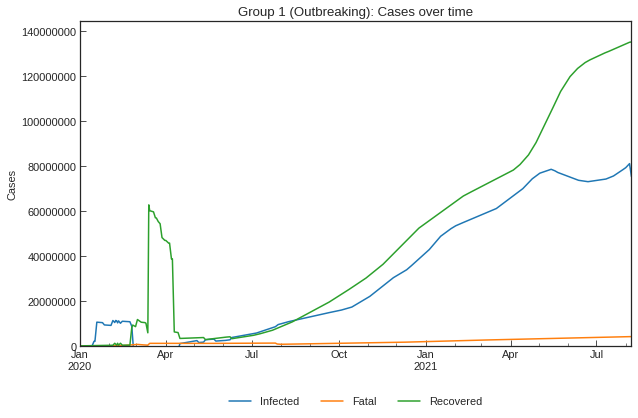

In [33]:
df = covid_df.loc[covid_df["Group"] == "Outbreaking", ["Date", *data_cols]]
df = df.groupby("Date").sum()
df = df.iloc[:-1, :]
if not df.empty:
    cs.line_plot(df, "Group 1 (Outbreaking): Cases over time", y_integer=True)
    df.tail()


In [34]:
df = growth_df.loc[growth_df["Group"] == "Stopping", :]
", ".join(df.index.tolist()) + "."

'Costa Rica, Botswana, Nicaragua, El Salvador, Haiti, Seychelles, Equatorial Guinea, Benin, Gambia, Palestine, Dominica, Bermuda, Afghanistan, Andorra, Venezuela, Gabon, Antigua and Barbuda, Belize, Bolivia, Ghana, Luxembourg, San Marino, Republic of the Congo, Burkina Faso, Cameroon, Central African Republic, Chad, Comoros, Cyprus, Guyana, Honduras, Kyrgyzstan, Lesotho, Malta, Netherlands, Saint Vincent and the Grenadines, Sao Tome and Principe, Switzerland, United Kingdom.'

In [36]:
growth_df.loc[growth_df["Group"] == "Stopping", :].head()

Date,Group,GF > 1 [straight days],GF < 1 [straight days],24Jul2021,25Jul2021,26Jul2021,27Jul2021,28Jul2021,29Jul2021,30Jul2021
Country,,,,,,,,,,
Costa Rica,Stopping,0,247,0.77,0.77,0.77,0.85,0.75,0.74,0.79
Botswana,Stopping,0,215,0.71,0.71,0.71,0.71,0.71,0.71,0.71
Nicaragua,Stopping,0,167,0.86,0.86,0.86,0.86,0.86,0.86,0.86
El Salvador,Stopping,0,71,0.71,0.71,0.71,0.71,0.61,0.61,0.61
Haiti,Stopping,0,60,0.00,0.00,0.05,0.06,0.18,0.17,-0.13


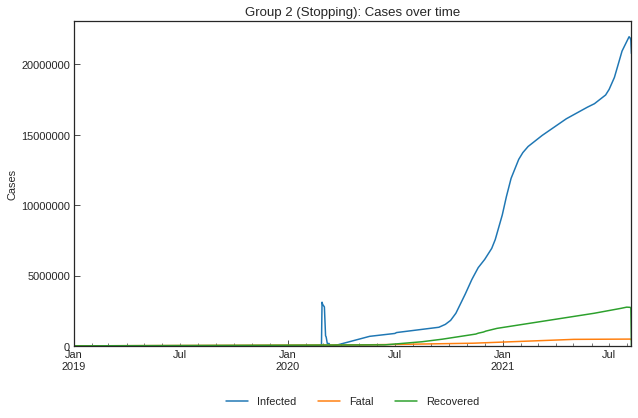

In [37]:
df = covid_df.loc[covid_df["Group"] == "Stopping", ["Date", *data_cols]].groupby("Date").sum()
if not df.empty:
    cs.line_plot(df, "Group 2 (Stopping): Cases over time", y_integer=True)
    df.tail()

In [38]:
df = growth_df.loc[growth_df["Group"] == "Crossroad", :]
", ".join(df.index.tolist()) + "."

"Iraq, Jordan, Angola, Fiji, Ireland, Liechtenstein, Mali, Rwanda, Saint Kitts and Nevis, Iceland, Mexico, North Macedonia, Panama, Somalia, Tajikistan, Togo, Virgin Islands, U.S., Zambia, Brunei, Cote d'Ivoire, Denmark, Djibouti, Jamaica, Maldives, Uganda, Guinea, Philippines, Saint Lucia, Sierra Leone, Yemen, Barbados, Cape Verde, Chile, Dominican Republic, Egypt, Guam, Mozambique, Namibia, Niger, Nigeria, Pakistan, Singapore, Tunisia, Myanmar, Oman, Cambodia, Ecuador, South Sudan, Bahamas, Colombia, Eritrea, Mauritius, Mongolia, Paraguay, Bosnia and Herzegovina, Kuwait, New Zealand, Papua New Guinea, Saudi Arabia, Uruguay, Brazil, Burundi, Guinea-Bissau, Hungary, Kazakhstan, Libya, Portugal, Taiwan, Tanzania, American Samoa, Anguilla, Aruba, Bonaire Sint Eustatius and Saba, British Virgin Islands, Cayman Islands, Cook Islands, Curacao, Czechia, DR Congo, Democratic Republic of Congo, Eswatini, Faeroe Islands, Falkland Islands, French Polynesia, Gibraltar, Greenland, Grenada, Guernse

In [39]:
growth_df.loc[growth_df["Group"] == "Crossroad", :].head()

Date,Group,GF > 1 [straight days],GF < 1 [straight days],24Jul2021,25Jul2021,26Jul2021,27Jul2021,28Jul2021,29Jul2021,30Jul2021
Country,,,,,,,,,,
Iraq,Crossroad,6,0,1.00,1.01,1.04,1.06,1.08,1.08,1.06
Jordan,Crossroad,6,0,0.95,1.02,1.17,1.18,1.27,1.21,1.20
Angola,Crossroad,5,0,1.10,0.98,1.15,1.27,1.22,1.23,1.17
Fiji,Crossroad,5,0,0.98,0.98,1.17,1.05,1.12,1.17,1.23
Ireland,Crossroad,5,0,1.00,1.00,1.03,1.01,1.01,1.03,1.02


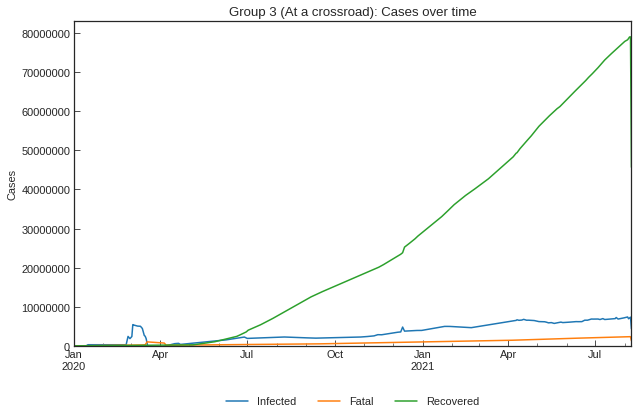

,Infected,Fatal,Recovered
Date,,,
2021-08-04,7390443,2330692,78294836
2021-08-05,6932636,2338445,78983262
2021-08-06,7154852,2344953,79009400
2021-08-07,7339487,2350923,79044937
2021-08-08,4335770,1292608,45671647


In [40]:
df = covid_df.loc[covid_df["Group"] == "Crossroad", ["Date", *data_cols]].groupby("Date").sum()
cs.line_plot(df, "Group 3 (At a crossroad): Cases over time", y_integer=True)
df.tail()

In [41]:
# Set tau value and start date of records
# For explanation, the start date will be 01Jan2020
# This is not based on actual data
example_data = cs.ExampleData(tau=1440, start_date="01Jan2020")
# No records has been registered
example_data.cleaned()

,Date,Country,Province,Confirmed,Infected,Fatal,Recovered


In [42]:
# Model name
print(cs.SIR.NAME)
# Example parameter values
pprint(cs.SIR.EXAMPLE, compact=True)

SIR
{'param_dict': {'rho': 0.2, 'sigma': 0.075},
 'population': 1000000,
 'step_n': 180,
 'y0_dict': {'Fatal or Recovered': 0, 'Infected': 1000, 'Susceptible': 999000}}


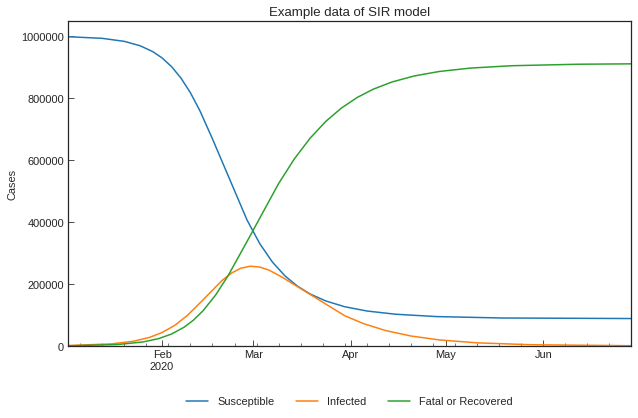

In [43]:
model = cs.SIR
area = {"country": "Full", "province": model.NAME}
# Add records with SIR model
example_data.add(model, **area)
# Records with model variables
df = example_data.specialized(model, **area)
cs.line_plot(
    df.set_index("Date"),
    title=f"Example data of {model.NAME} model",
    y_integer=True
)

In [44]:
eg_r0 = model(model.EXAMPLE["population"], **model.EXAMPLE["param_dict"]).calc_r0()
df = example_data.specialized(model, **area)
x_max = df.loc[df["Infected"].idxmax(), "Susceptible"] / cs.SIR.EXAMPLE["population"]
(x_max, 1/eg_r0)

(0.366211, 0.37453183520599254)

In [45]:
# Model name
print(cs.SIRD.NAME)
# Example parameter values
pprint(cs.SIRD.EXAMPLE, compact=True)

SIR-D
{'param_dict': {'kappa': 0.005, 'rho': 0.2, 'sigma': 0.075},
 'population': 1000000,
 'step_n': 180,
 'y0_dict': {'Fatal': 0,
             'Infected': 1000,
             'Recovered': 0,
             'Susceptible': 999000}}


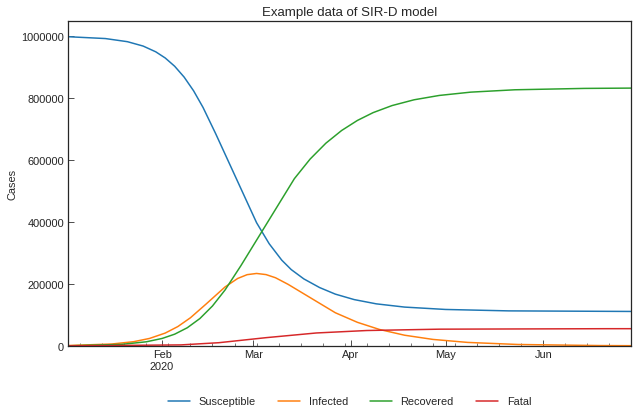

In [46]:
model = cs.SIRD
area = {"country": "Full", "province": model.NAME}
# Add records with SIR model
example_data.add(model, **area)
# Records with model variables
df = example_data.specialized(model, **area)
cs.line_plot(
    df.set_index("Date"),
    title=f"Example data of {model.NAME} model",
    y_integer=True
)

In [47]:
eg_r0 = model(model.EXAMPLE["population"], **model.EXAMPLE["param_dict"]).calc_r0()
df = example_data.specialized(model, **area)
x_max = df.loc[df["Infected"].idxmax(), "Susceptible"] / cs.SIR.EXAMPLE["population"]
(x_max, 1/eg_r0)

(0.397814, 0.4)

In [48]:
# Model name
print(cs.SIRF.NAME)
# Example parameter values
pprint(cs.SIRF.EXAMPLE, compact=True)

SIR-F
{'param_dict': {'kappa': 0.005, 'rho': 0.2, 'sigma': 0.075, 'theta': 0.002},
 'population': 1000000,
 'step_n': 180,
 'y0_dict': {'Fatal': 0,
             'Infected': 1000,
             'Recovered': 0,
             'Susceptible': 999000}}


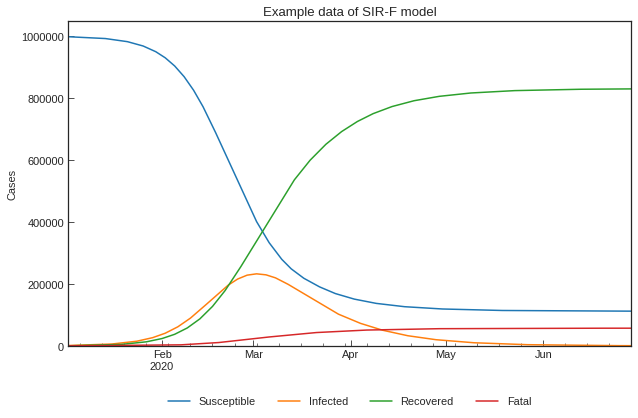

In [49]:
model = cs.SIRF
area = {"country": "Full", "province": model.NAME}
# Add records with SIR model
example_data.add(model, **area)
# Records with model variables
df = example_data.specialized(model, **area)
cs.line_plot(
    df.set_index("Date"),
    title=f"Example data of {model.NAME} model",
    y_integer=True
)

In [50]:
eg_r0 = model(model.EXAMPLE["population"], **model.EXAMPLE["param_dict"]).calc_r0()
df = example_data.specialized(model, **area)
x_max = df.loc[df["Infected"].idxmax(), "Susceptible"] / cs.SIR.EXAMPLE["population"]
(x_max, 1/eg_r0)

(0.401442, 0.4)

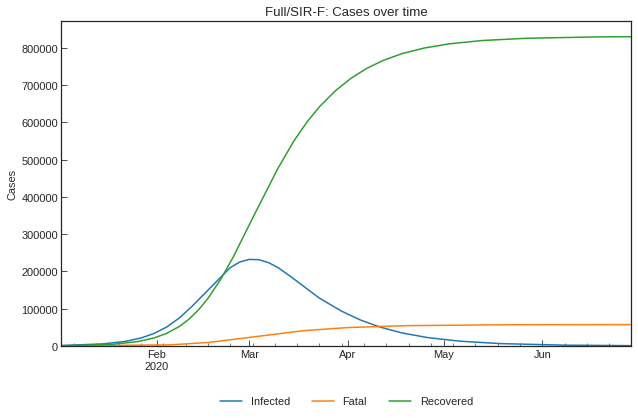

In [51]:
# Show records in JHU-style
sirf_snl = cs.Scenario(example_data, tau=1440, **area)
_ = sirf_snl.records()

In [52]:
# Set phases (phase: explained in "S-R trend analysis section")
# Records at 01Jan2020 will be removed because Recovered = 0
sirf_snl.clear(include_past=True)
sirf_snl.add().summary()

,Type,Start,End,Population
0th,Past,02Jan2020,29Jun2020,1000000


In [53]:
# Parameter estimation
sirf_snl.estimate(cs.SIRF)


<SIR-F model: parameter estimation>
Running optimization with 2 CPUs...
	02Jan2020 - 29Jun2020: finished  329 trials in 0 min  7 sec
Completed optimization. Total: 0 min  7 sec


In [54]:
df = sirf_snl.summary()
setting_model = cs.SIRF(population=cs.SIRF.EXAMPLE["population"], **cs.SIRF.EXAMPLE["param_dict"])
setting_dict = {
    "Population": cs.SIRF.EXAMPLE["population"],
    "ODE": cs.SIRF.NAME,
    "Rt": setting_model.calc_r0(),
    "tau": 1440,
    **setting_model.calc_days_dict(1440),
    **cs.SIRF.EXAMPLE["param_dict"]
}
df = df.append(pd.Series(setting_dict, name="setting"))
df.fillna("-")

,Type,Start,End,Population,ODE,Rt,theta,kappa,rho,sigma,tau,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
0th,Past,02Jan2020,29Jun2020,1000000,SIR-F,2.48,0.000561,0.005189,0.199823,0.075206,1440,0.001,192.0,5.0,13.0,0.00874859,329,0 min 7 sec
setting,-,-,-,1000000,SIR-F,2.50,0.002000,0.005000,0.200000,0.075000,1440,0.002,200.0,5.0,13.0,-,-,-


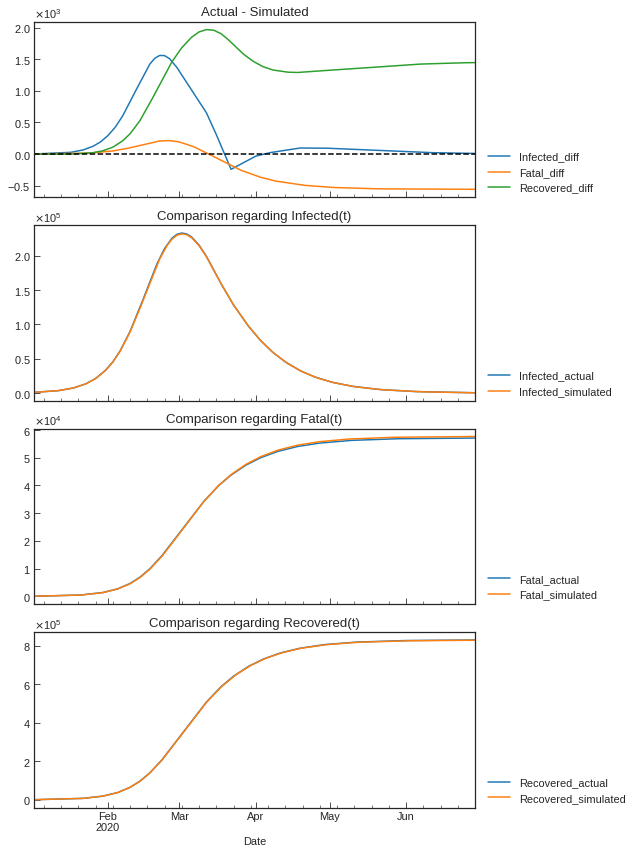

In [55]:
sirf_snl.estimate_accuracy("0th")

In [56]:
latent_period = 6 * 24 * 60
waiting_time = 7 * 24 * 60
latent_waiting_day = latent_period + waiting_time

In [57]:
df = cs.SIRF.EXAMPLE["param_dict"]
tau = 1440
eg_rho2, eg_rho3 = tau / latent_period, tau / waiting_time
(eg_rho2, eg_rho3)

(0.16666666666666666, 0.14285714285714285)

In [58]:
param_dict = cs.SEWIRF.EXAMPLE["param_dict"]
param_dict.update({"rho2":eg_rho2, "eho3": eg_rho3})
pprint(param_dict, compact=True)

{'eho3': 0.14285714285714285,
 'kappa': 0.005,
 'rho1': 0.2,
 'rho2': 0.16666666666666666,
 'rho3': 0.167,
 'sigma': 0.075,
 'theta': 0.002}


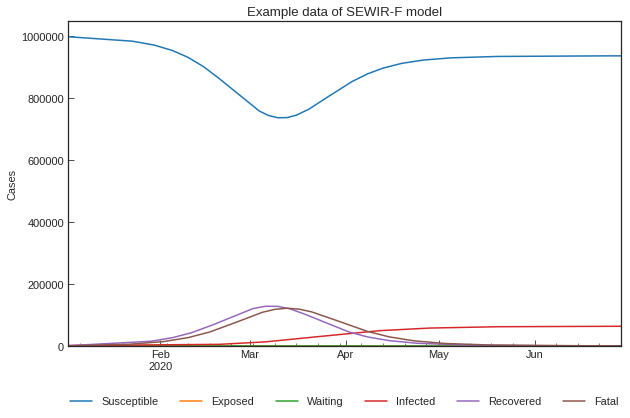

In [59]:
model = cs.SEWIRF
area = {"country": "Full", "province": model.NAME}
# Add records with SIR model
example_data.add(model, param_dict=param_dict, **area)
# Records with model variables
df = example_data.specialized(model, **area)
cs.line_plot(
    df.set_index("Date"),
    title=f"Example data of {model.NAME} model",
    y_integer=True
)

In [60]:
# Preset of SIR-F parameters
preset_dict = cs.SIRF.EXAMPLE["param_dict"]
preset_dict

{'kappa': 0.005, 'rho': 0.2, 'sigma': 0.075, 'theta': 0.002}

In [61]:
area = {"country": "Theoretical"}
# Create dataset from 01Jan2020 to 31Jan2020
example_data.add(cs.SIRF, step_n=30, **area)

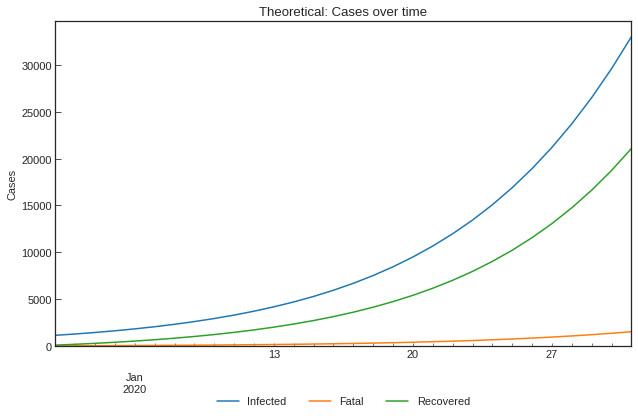

,Date,Infected,Fatal,Recovered
0,2020-01-02,1127,6,80
1,2020-01-03,1270,12,169
2,2020-01-04,1430,19,271
3,2020-01-05,1612,28,385
4,2020-01-06,1816,37,513


,Date,Infected,Fatal,Recovered
25,2020-01-27,21210,940,13068
26,2020-01-28,23730,1061,14753
27,2020-01-29,26524,1196,16637
28,2020-01-30,29616,1347,18741
29,2020-01-31,33030,1515,21088


In [62]:
# Show records with Scenario class
snl = cs.Scenario(example_data, tau=1440, **area)
record_df = snl.records()
display(record_df.head())
display(record_df.tail())

In [63]:
# Value of beta before actions are taken
rho_before = cs.SIRF.EXAMPLE["param_dict"]["rho"]
rho_before

0.2

In [64]:
eg_out_df = go_out("Italy")
eg_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Age,Population,Portion
0,0,2,nursery,3,0,0,2,1373871,0.025722
1,3,5,nursery school,4,0,1,5,1441955,0.026997
2,6,10,elementary school,5,0,1,10,2667055,0.049933
3,11,13,middle school,5,0,1,13,1688673,0.031616
4,14,18,high school,6,0,1,18,2829215,0.052969
5,19,25,university/work,3,3,1,25,4087599,0.076529
6,26,35,work,0,6,1,35,6521421,0.122096
7,36,45,work,0,5,1,45,7940871,0.148671
8,46,55,work,0,5,1,55,9560703,0.178998
9,56,65,work,0,5,1,65,8261046,0.154666


In [65]:
gs_before = (eg_out_df[["School", "Office", "Others"]].sum(axis=1) * eg_out_df["Portion"]).sum()
gs_before

5.794427227320437

In [66]:
df = eg_out_df.copy()
df.loc[df["School"] + df["Office"] > 0, "Others"] += 1
df["School"] = 0
df["Office"] *= 0.5
eg_out_df_after = df.copy()
eg_out_df_after

,Age_first,Age_last,Period_of_life,School,Office,Others,Age,Population,Portion
0,0,2,nursery,0,0.0,1,2,1373871,0.025722
1,3,5,nursery school,0,0.0,2,5,1441955,0.026997
2,6,10,elementary school,0,0.0,2,10,2667055,0.049933
3,11,13,middle school,0,0.0,2,13,1688673,0.031616
4,14,18,high school,0,0.0,2,18,2829215,0.052969
5,19,25,university/work,0,1.5,2,25,4087599,0.076529
6,26,35,work,0,3.0,2,35,6521421,0.122096
7,36,45,work,0,2.5,2,45,7940871,0.148671
8,46,55,work,0,2.5,2,55,9560703,0.178998
9,56,65,work,0,2.5,2,65,8261046,0.154666


In [67]:
df = eg_out_df_after.copy()
gs_after = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
gs_after

3.8354021528726467

In [68]:
rho_after = rho_before * (gs_after / gs_before)
rho_after / rho_before

0.6619122136505426

In [69]:
# Set 0th phase from 02Jan2020 to 31Jan2020 with preset parameter values
snl.clear(include_past=True)
snl.add(end_date="31Jan2020", model=cs.SIRF, **preset_dict)
snl.summary()
# Add main scenario: the same parameter to 31Dec2020
snl.add(end_date="31Dec2020", name="Main")
# Add lockdown scenario
snl.clear(include_past=False, name="Lockdown")
snl.add(end_date="31Dec2020", name="Lockdown", rho=rho_after).summary()

Type      Start  ... 1/beta [day]  1/gamma [day]
Scenario Phase                     ...                            
Main     0th      Past  02Jan2020  ...          5.0           13.0
         1st    Future  01Feb2020  ...          5.0           13.0
Lockdown 0th      Past  02Jan2020  ...          5.0           13.0
         1st    Future  01Feb2020  ...          7.0           13.0

[4 rows x 15 columns]

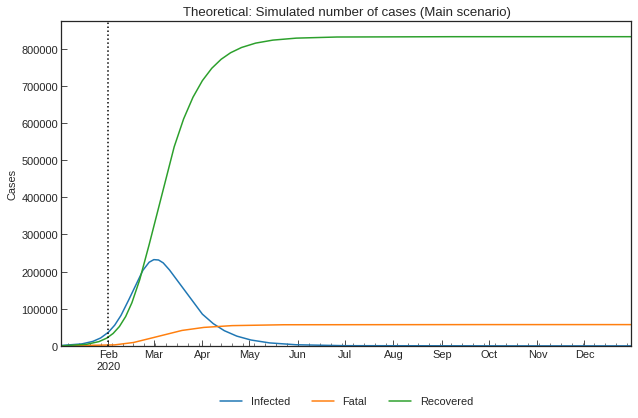

In [70]:
_ = snl.simulate(name="Main")

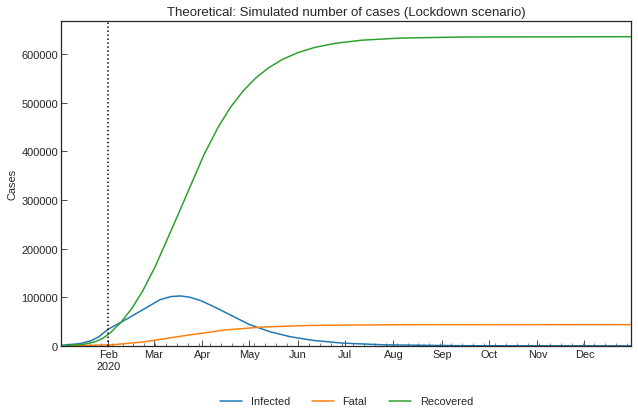

In [71]:
_ = snl.simulate(name="Lockdown")

In [72]:
snl.describe()

,max(Infected),argmax(Infected),Confirmed on 31Dec2020,Infected on 31Dec2020,Fatal on 31Dec2020,1st_Rt
Main,232800,02Mar2020,890043,0,57295,2.50
Lockdown,102662,17Mar2020,679116,6,43716,1.65


In [73]:
sigma_before = preset_dict["sigma"]
kappa_before = preset_dict["kappa"]
(sigma_before, kappa_before)

(0.075, 0.005)

In [74]:
h_bar_before, s_bar_before = 0.5, 0.5

In [75]:
h_bar_after = h_bar_before * 0.1
s_bar_after = s_bar_before
(h_bar_after, s_bar_after)

(0.05, 0.5)

In [76]:
sigma_after = sigma_before * (1 - h_bar_after * s_bar_after) / (1 - h_bar_before * s_bar_before)
sigma_after

0.09749999999999999

In [77]:
kappa_after = kappa_before * (h_bar_after * s_bar_after) / (h_bar_before * s_bar_before)
kappa_after

0.0005

In [78]:
# Add medicine scenario
snl.clear(name="Medicine")
snl.add(end_date="31Dec2020", name="Medicine", kappa=kappa_after, sigma=sigma_after)
snl.summary()

Type      Start  ... 1/beta [day]  1/gamma [day]
Scenario Phase                     ...                            
Main     0th      Past  02Jan2020  ...          5.0           13.0
         1st    Future  01Feb2020  ...          5.0           13.0
Lockdown 0th      Past  02Jan2020  ...          5.0           13.0
         1st    Future  01Feb2020  ...          7.0           13.0
Medicine 0th      Past  02Jan2020  ...          5.0           13.0
         1st    Future  01Feb2020  ...          5.0           10.0

[6 rows x 15 columns]

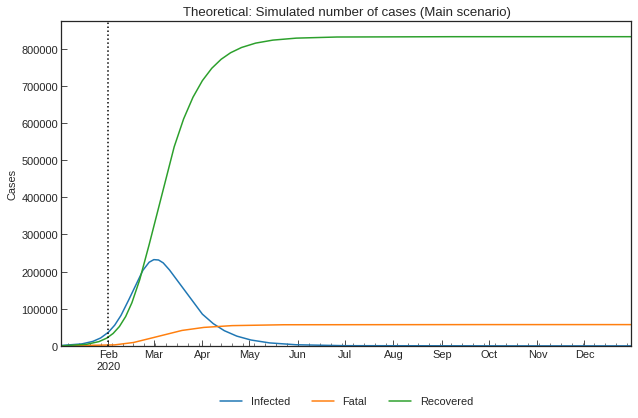

In [79]:
_ = snl.simulate(name="Main")

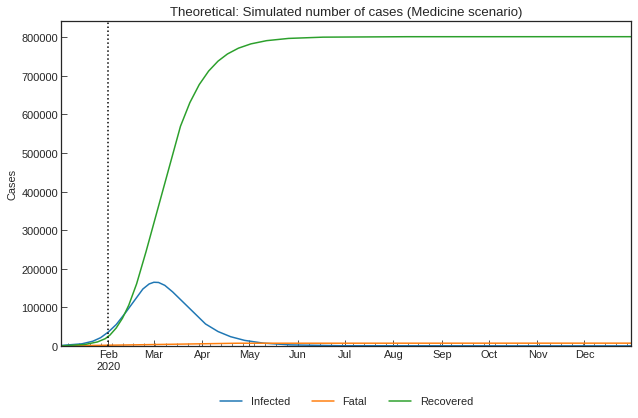

In [80]:
_ = snl.simulate(name="Medicine")

In [81]:
snl.describe()

,max(Infected),argmax(Infected),Confirmed on 31Dec2020,Infected on 31Dec2020,Fatal on 31Dec2020,1st_Rt
Main,232800,02Mar2020,890043,0,57295,2.50
Lockdown,102662,17Mar2020,679116,6,43716,1.65
Medicine,165235,02Mar2020,808440,0,7023,2.04


In [82]:
# Add vaccine scenario
snl.clear("Vaccine")
rho_vac = snl.get("rho", phase="0th") * 0.8
sigma_vac = snl.get("sigma", phase="0th") * 1.2
kappa_vac = snl.get("kappa", phase="0th") * 0.6
snl.add(end_date="31Dec2020", name="Vaccine",  rho=rho_vac, kappa=kappa_vac, sigma=sigma_vac)
snl.summary()

Type      Start  ... 1/beta [day]  1/gamma [day]
Scenario Phase                     ...                            
Main     0th      Past  02Jan2020  ...          5.0           13.0
         1st    Future  01Feb2020  ...          5.0           13.0
Lockdown 0th      Past  02Jan2020  ...          5.0           13.0
         1st    Future  01Feb2020  ...          7.0           13.0
Medicine 0th      Past  02Jan2020  ...          5.0           13.0
         1st    Future  01Feb2020  ...          5.0           10.0
Vaccine  0th      Past  02Jan2020  ...          5.0           13.0
         1st    Future  01Feb2020  ...          6.0           11.0

[8 rows x 15 columns]

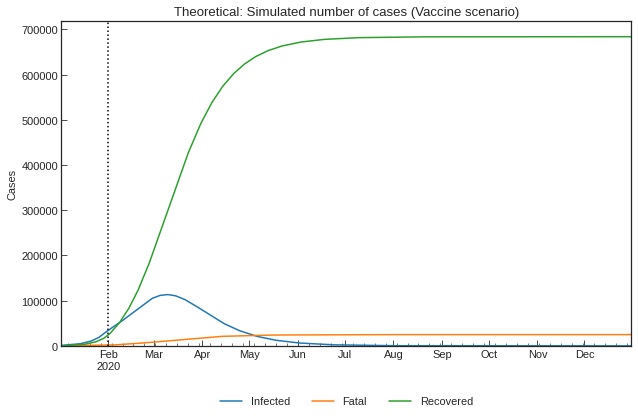

In [83]:
_ = snl.simulate(name="Vaccine")

In [84]:
snl.describe()

,max(Infected),argmax(Infected),Confirmed on 31Dec2020,Infected on 31Dec2020,Fatal on 31Dec2020,1st_Rt
Main,232800,02Mar2020,890043,0,57295,2.50
Lockdown,102662,17Mar2020,679116,6,43716,1.65
Medicine,165235,02Mar2020,808440,0,7023,2.04
Vaccine,113534,09Mar2020,708848,0,24917,1.72


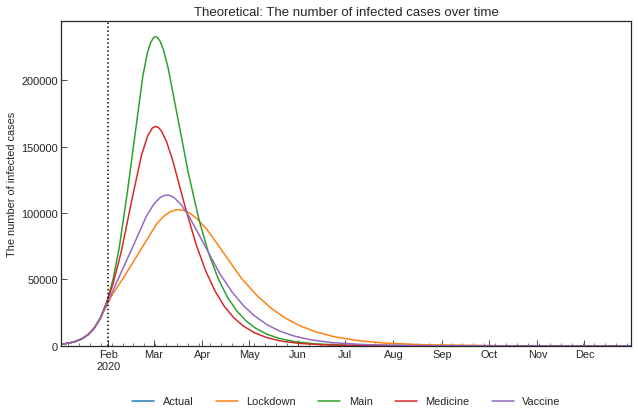

In [85]:
_ = snl.history(target="Infected")

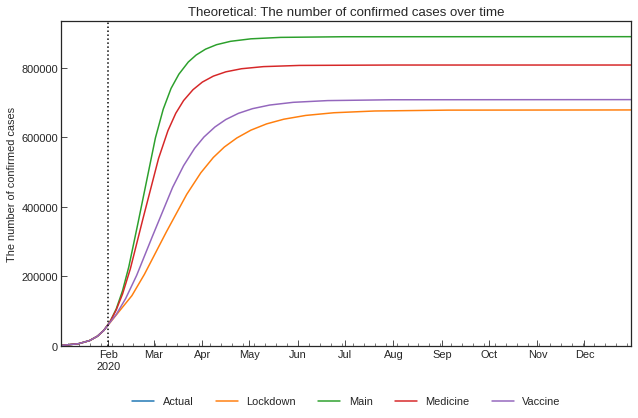

In [86]:
_ = snl.history(target="Confirmed")

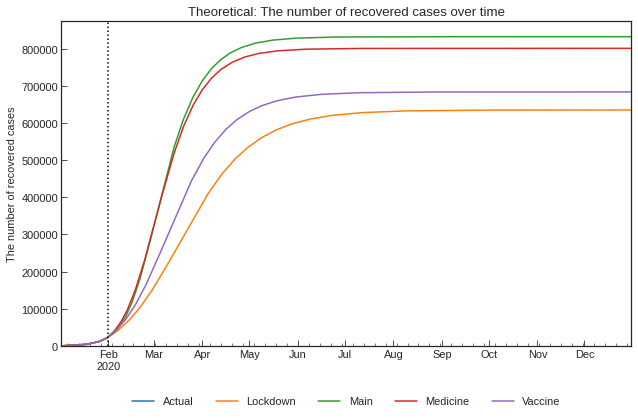

In [87]:
_ = snl.history(target="Recovered")

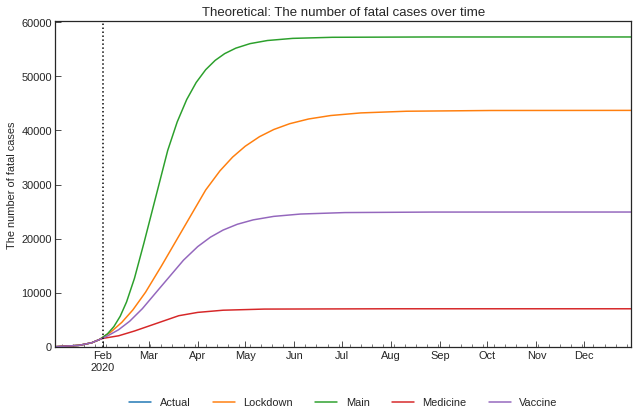

In [88]:
_ = snl.history(target="Fatal")

In [89]:
import warnings
warnings.simplefilter("ignore")
df = pd.DataFrame()
eg_step_n = 200
eg_tau= 1440
eg_population = cs.SIR.EXAMPLE["population"]
eg_param_dict = {
    "1": {"theta": 0.0002, "kappa": 0.005, "rho": 0.20, "sigma": 0.075},
    "2": {"theta": 0.0002, "kappa": 0.005, "rho": 0.40, "sigma": 0.075},
    "3": {"theta": 0.0002, "kappa": 0.005, "rho": 0.15, "sigma": 0.075},
    "4": {"theta": 0.0002, "kappa": 0.003, "rho": 0.20, "sigma": 0.150},
    "5": {"theta": 0.0000, "kappa": 0.005, "rho": 0.20, "sigma": 0.075},
}

for (num, _dict) in eg_param_dict.items():
    simulator = cs.ODESimulator(country=f"Example {num}")
    simulator.add(
        model=cs.SIRF,
        step_n=eg_step_n,
        population=eg_population,
        param_dict=_dict,
        y0_dict={"Susceptible": 999_000, "Infected": 1000, "Recovered": 0, "Fatal": 0}
    )
    simulator.run()
    _df = simulator.dim(tau=eg_tau, start_date="22Jan2020")
    df = pd.concat([df, _df], axis=0, ignore_index=True)

df["Confirmed"] = df[["Infected", "Recovered", "Fatal"]].sum(axis=1)
eg_ncov_df = df.copy()
eg_ncov_df.tail()

,Date,Country,Province,Susceptible,Infected,Recovered,Fatal,Confirmed
1000,2020-08-05,Example 5,-,111067,224,833165,55544,888933
1001,2020-08-06,Example 5,-,111062,211,833181,55545,888937
1002,2020-08-07,Example 5,-,111057,199,833197,55546,888942
1003,2020-08-08,Example 5,-,111053,188,833211,55547,888946
1004,2020-08-09,Example 5,-,111049,178,833225,55548,888951


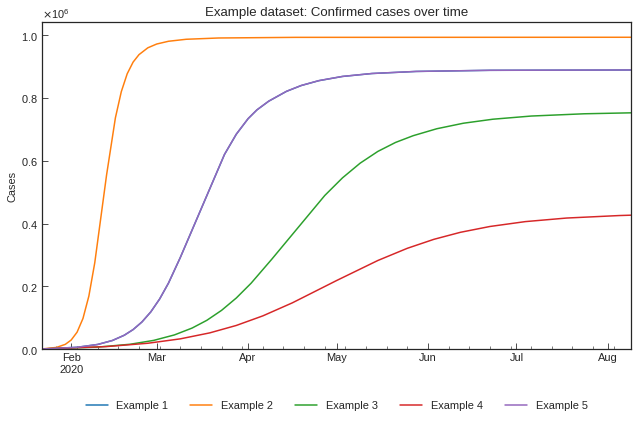

In [90]:
cs.line_plot(
    eg_ncov_df.pivot_table(index="Date", columns="Country", values="Confirmed"),
    "Example dataset: Confirmed cases over time"
)

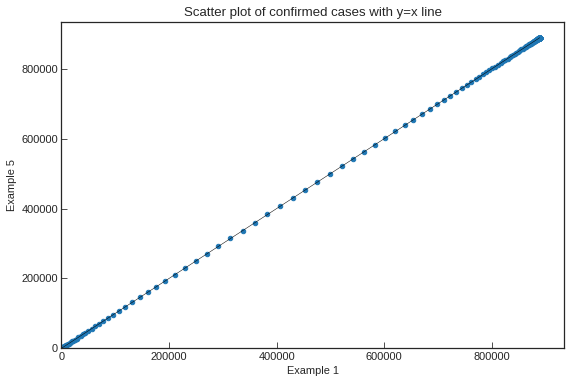

In [91]:
df = eg_ncov_df.pivot_table(index="Date", columns="Country", values="Confirmed")
df.plot.scatter(x="Example 1", y="Example 5")
plt.plot(df["Example 1"], df["Example 1"], color="black", linewidth=0.5)
plt.xlim(0, None)
plt.ylim(0, None)
plt.title("Scatter plot of confirmed cases with y=x line")
plt.show()

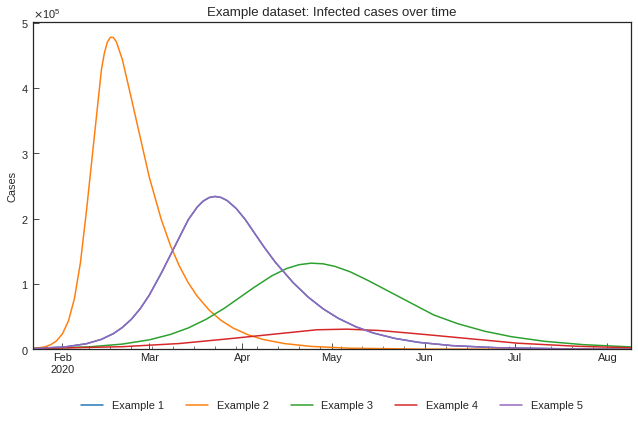

In [92]:
cs.line_plot(
    eg_ncov_df.pivot_table(index="Date", columns="Country", values="Infected"),
    "Example dataset: Infected cases over time"
)

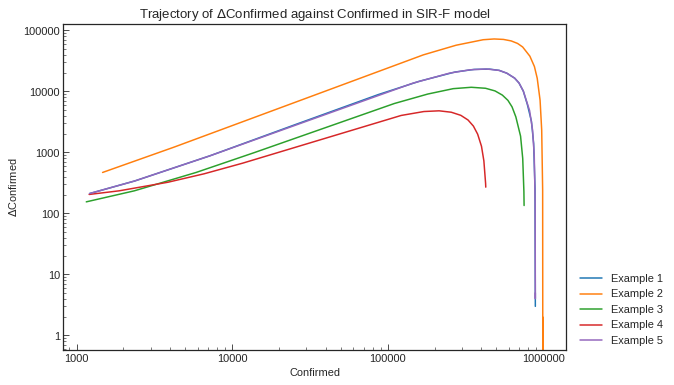

In [93]:
for country in eg_ncov_df["Country"].unique():
    df = eg_ncov_df.copy()
    df = df.loc[df["Country"] == country, :]
    df = df.groupby("Date").last()
    plt.plot(df["Confirmed"], df["Confirmed"].diff(), label=country)

plt.title(r"Trajectory of $\Delta$Confirmed against Confirmed in SIR-F model")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Confirmed")
plt.ylabel(r"$\Delta$Confirmed")
fmt = matplotlib.ticker.ScalarFormatter(useOffset=False)
fmt.set_scientific(False)
plt.gca().xaxis.set_major_formatter(fmt)
plt.gca().yaxis.set_major_formatter(fmt)
plt.legend(bbox_to_anchor=(1.02, 0), loc="lower left", borderaxespad=0)
plt.show()

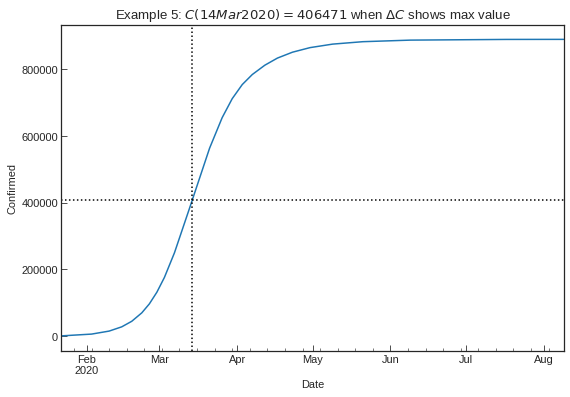

In [94]:
country = "Example 5"
df = eg_ncov_df.copy()
df = df.loc[df["Country"] == country, :].groupby("Date").last()
arg_tt = df["Confirmed"].diff().idxmax()
arg_cc = df.loc[arg_tt, "Confirmed"]
# Plot
df["Confirmed"].plot()
plt.axhline(y=arg_cc, color="black", linestyle=":")
plt.axvline(x=arg_tt, color="black", linestyle=":")
plt.ylabel("Confirmed")
plt.title(
    r'{0}: $C({1})={2}$ when $\Delta C$ shows max value'.format(
        country, arg_tt.strftime("%d%b%Y"), arg_cc)
)
fmt = matplotlib.ticker.ScalarFormatter(useOffset=False)
fmt.set_scientific(False)
plt.gca().yaxis.set_major_formatter(fmt)
plt.show()

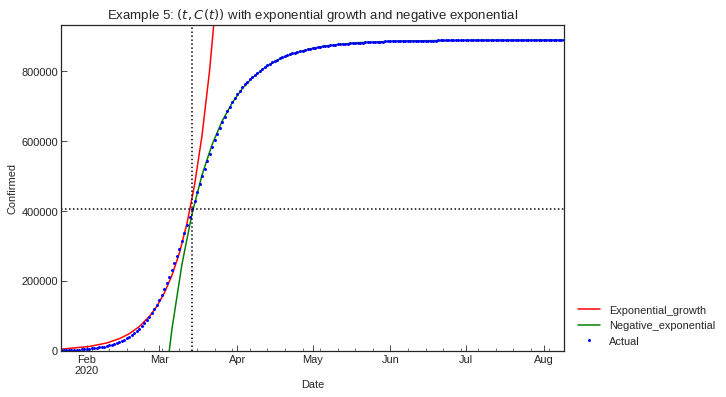

In [95]:
country = "Example 5"
df = eg_ncov_df.copy()
df = df.loc[df["Country"] == country, :].groupby("Date").last()
start_date = df.index.min()
arg_tt = df["Confirmed"].diff().idxmax()
arg_dd = int((arg_tt - start_date).total_seconds() / 60 / 60 / 24)
arg_cc = df.loc[arg_tt, "Confirmed"]
# Convert date to elapsed time (day)
df.index = ((df.index - start_date).total_seconds() / 60 / 60 / 24).astype(np.int64)
# Curve fitting with exponential growth function
f = lambda x, a, b: a * np.exp(b * x)
series = df.loc[df.index <= arg_dd, "Confirmed"]
a_ini = series[0]
b_ini = np.log(arg_cc / a_ini) / arg_dd
param, _ = sci.optimize.curve_fit(f, series.index, series, p0=[a_ini, b_ini])
f_partial = functools.partial(f, a=param[0], b=param[1])
df["Exponential_growth"] = pd.Series(df.index).apply(lambda x: f_partial(x))
# Curve fitting with negative exponential function
f = lambda x, a, b, c: c - a * np.exp(- b * (x - arg_dd))
series = df.loc[df.index >= arg_dd, "Confirmed"]
c_ini = series.max()
a_ini = c_ini - arg_cc
b_ini = series.diff()[arg_dd + 1] / a_ini
param, _ = sci.optimize.curve_fit(f, series.index, series, p0=[a_ini, b_ini, c_ini])
f_partial = functools.partial(f, a=param[0], b=param[1], c=param[2])
df["Negative_exponential"] = pd.Series(df.index).apply(lambda x: f_partial(x))
# Convert elapsed time (day) to date
df.index = start_date + pd.Series(df.index).apply(lambda x: timedelta(days=x))
# Plot
df[["Exponential_growth", "Negative_exponential"]].plot(color=["red", "green"])
df["Actual"] = df["Confirmed"]
df["Actual"].plot(color="blue", marker=".", markeredgewidth=0, linewidth=0)
plt.axhline(y=arg_cc, color="black", linestyle=":")
plt.axvline(x=arg_tt, color="black", linestyle=":")
plt.ylabel("Confirmed")
plt.ylim(0, max(df["Confirmed"]) * 1.05)
plt.title(r"{0}: $(t, C(t))$ with exponential growth and negative exponential".format(country))
fmt = matplotlib.ticker.ScalarFormatter(useOffset=False)
fmt.set_scientific(False)
plt.gca().yaxis.set_major_formatter(fmt)
plt.legend(bbox_to_anchor=(1.02, 0), loc="lower left", borderaxespad=0)
plt.show()

In [96]:
S = sym.symbols("S", cls=sym.Function)
N, R = sym.symbols("N R", positive=True)
beta, gamma = sym.symbols(r"\beta \gamma", positive=True)
dSdR = - beta / (N * gamma) * S(R)
sr = sym.dsolve(S(R).diff(R) - dSdR, hint="separable", ics={S(0): N})
sr

Eq(S(R), N*exp(-R*\beta/(N*\gamma)))

In [97]:
sym.Eq(sym.simplify(sym.log(sr.lhs)), sym.simplify(sym.log(sr.rhs)))

Eq(log(S(R)), log(N) - R*\beta/(N*\gamma))

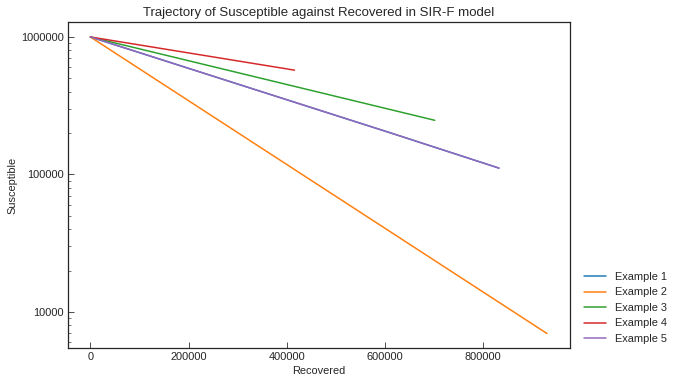

In [98]:
for country in eg_ncov_df["Country"].unique():
    df = eg_ncov_df.copy()
    df = df.loc[df["Country"] == country, :]
    df = df.groupby("Date").last()
    plt.plot(df["Recovered"], eg_population - df["Confirmed"], label=country)

plt.title(r"Trajectory of Susceptible against Recovered in SIR-F model")
plt.yscale("log")
plt.xlabel("Recovered")
plt.ylabel("Susceptible")
fmt = matplotlib.ticker.ScalarFormatter(useOffset=False)
fmt.set_scientific(False)
plt.gca().xaxis.set_major_formatter(fmt)
plt.gca().yaxis.set_major_formatter(fmt)
plt.legend(bbox_to_anchor=(1.02, 0), loc="lower left", borderaxespad=0)
plt.show()

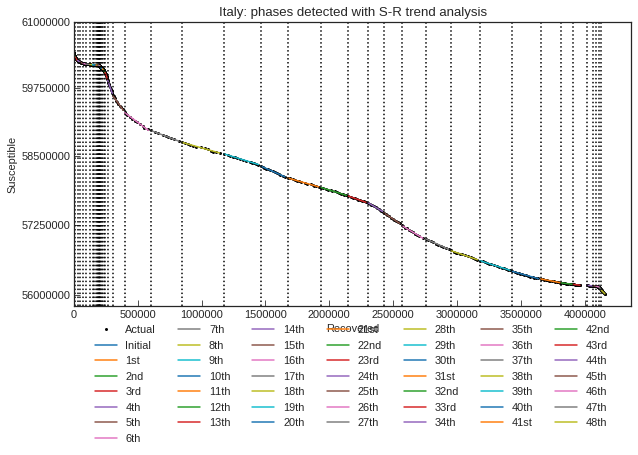

In [99]:
ita_scenario = cs.Scenario(country="Italy")
ita_scenario.register(jhu_data)
_ = ita_scenario.trend()

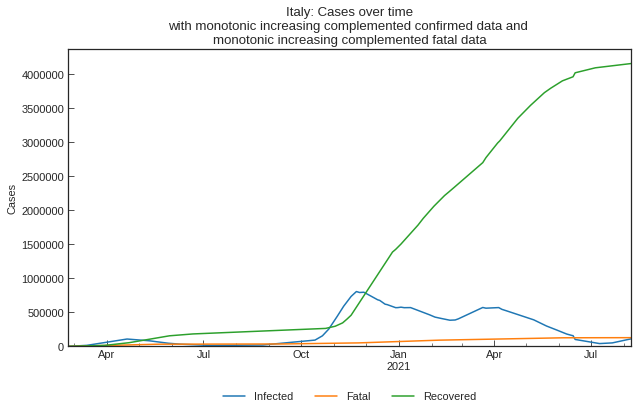

,Date,Infected,Fatal,Recovered
527,2021-08-04,97220,128136,4144608
528,2021-08-05,101046,128163,4147979
529,2021-08-06,104685,128187,4150915
530,2021-08-07,108535,128209,4153940
531,2021-08-08,112266,128220,4155931


In [100]:
# ita_scenario = cs.Scenario(country="Italy")
# ita_scenario.register(jhu_data, population_data)
ita_scenario.records().tail()

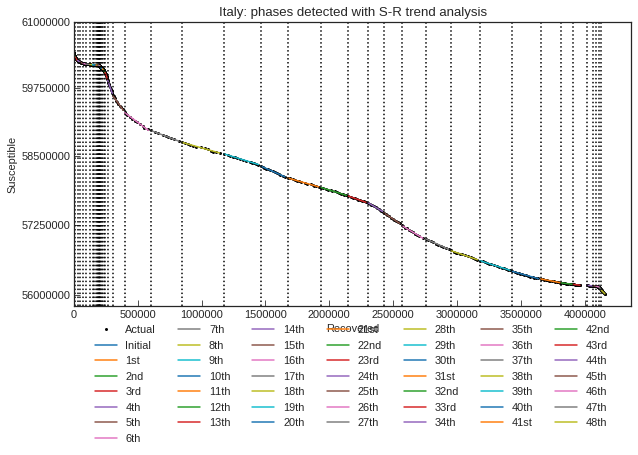

In [101]:
_ = ita_scenario.trend()

In [102]:
ita_scenario.summary()

,Type,Start,End,Population
0th,Past,24Feb2020,03Mar2020,60421760
1st,Past,04Mar2020,12Mar2020,60421760
2nd,Past,13Mar2020,25Mar2020,60421760
3rd,Past,26Mar2020,09Apr2020,60421760
4th,Past,10Apr2020,20Apr2020,60421760
5th,Past,21Apr2020,28Apr2020,60421760
6th,Past,29Apr2020,07May2020,60421760
7th,Past,08May2020,17May2020,60421760
8th,Past,18May2020,26May2020,60421760
9th,Past,27May2020,03Jun2020,60421760


In [103]:
ita_scenario.estimate(cs.SIRF, timeout=120)


<SIR-F model: parameter estimation>
Running optimization with 2 CPUs...
	 7th phase (08May2020 - 17May2020): finished   42 trials in 0 min  1 sec
	 8th phase (18May2020 - 26May2020): finished   43 trials in 0 min  1 sec
	 9th phase (27May2020 - 03Jun2020): finished   43 trials in 0 min  1 sec
	 0th phase (24Feb2020 - 03Mar2020): finished  173 trials in 0 min  5 sec
	10th phase (04Jun2020 - 12Jun2020): finished   80 trials in 0 min  2 sec
	11th phase (13Jun2020 - 22Jun2020): finished   79 trials in 0 min  2 sec
	12th phase (23Jun2020 - 30Jun2020): finished   43 trials in 0 min  1 sec
	13th phase (01Jul2020 - 08Jul2020): finished   42 trials in 0 min  1 sec
	14th phase (09Jul2020 - 23Jul2020): finished  148 trials in 0 min  4 sec
	 1st phase (04Mar2020 - 12Mar2020): finished  286 trials in 0 min  9 sec
	15th phase (24Jul2020 - 05Aug2020): finished   44 trials in 0 min  1 sec
	16th phase (06Aug2020 - 18Aug2020): finished   43 trials in 0 min  1 sec
	17th phase (19Aug2020 - 26Aug2020): fi

In [104]:
ita_scenario.summary()

,Type,Start,End,Population,ODE,Rt,theta,kappa,rho,sigma,tau,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
0th,Past,24Feb2020,03Mar2020,60421760,SIR-F,12.56,0.000947,0.007982,0.336244,0.018767,1440,0.001,125.0,2.0,53.0,0.373667,173.0,0 min 5 sec
1st,Past,04Mar2020,12Mar2020,60421760,SIR-F,6.67,0.014496,0.012513,0.233434,0.021996,1440,0.014,79.0,4.0,45.0,0.089535,286.0,0 min 9 sec
2nd,Past,13Mar2020,25Mar2020,60421760,SIR-F,4.36,0.010840,0.014631,0.159605,0.021617,1440,0.011,68.0,6.0,46.0,0.053903,315.0,0 min 10 sec
3rd,Past,26Mar2020,09Apr2020,60421760,SIR-F,2.47,0.020160,0.009113,0.062164,0.015577,1440,0.020,109.0,16.0,64.0,0.037452,368.0,0 min 12 sec
4th,Past,10Apr2020,20Apr2020,60421760,SIR-F,1.56,0.031575,0.004218,0.034399,0.017200,1440,0.032,237.0,29.0,58.0,0.010401,320.0,0 min 10 sec
5th,Past,21Apr2020,28Apr2020,60421760,SIR-F,0.88,0.030879,0.002981,0.025053,0.024747,1440,0.031,335.0,39.0,40.0,0.006894,321.0,0 min 10 sec
6th,Past,29Apr2020,07May2020,60421760,SIR-F,0.50,0.027672,0.002449,0.015711,0.028375,1440,0.028,408.0,63.0,35.0,0.018189,320.0,0 min 10 sec
7th,Past,08May2020,17May2020,60421760,SIR-F,0.34,0.003713,0.002537,0.013469,0.036904,1440,0.004,394.0,74.0,27.0,0.011103,42.0,0 min 1 sec
8th,Past,18May2020,26May2020,60421760,SIR-F,0.30,0.009204,0.001922,0.011850,0.037485,1440,0.009,520.0,84.0,26.0,0.003805,43.0,0 min 1 sec
9th,Past,27May2020,03Jun2020,60421760,SIR-F,0.14,0.039008,0.001834,0.007189,0.046504,1440,0.039,545.0,139.0,21.0,0.012124,43.0,0 min 1 sec


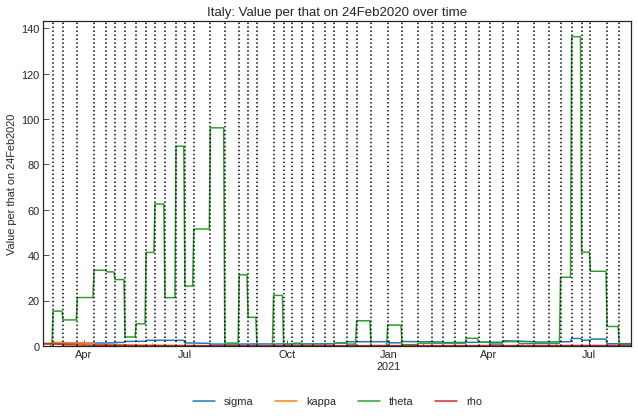

In [105]:
_ = ita_scenario.history_rate()

In [106]:
def _color(data_df):
    df = data_df.copy()
    df.loc[:, :] = str()
    df.iloc[[3, 6, 8], :] = "background-color: lightgreen"
    return df

ita_action_df.style.apply(_color, axis=None)

,Year,Sex,Age,Population
0,2020,Male,0,235862
1,2020,Male,1,235862
2,2020,Male,2,235862
3,2020,Male,3,235862
4,2020,Male,4,235862
5,2020,Female,0,222095
6,2020,Female,1,222095
7,2020,Female,2,222095
8,2020,Female,3,222095
9,2020,Female,4,222095


In [107]:
ita_scenario.get("Start", name="Main", phase="3rd")

'26Mar2020'

In [108]:
c_before, c_after = 1.0, 0.81

In [109]:
ita_out_df = go_out("Italy")
ita_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Age,Population,Portion
0,0,2,nursery,3,0,0,2,1373871,0.025722
1,3,5,nursery school,4,0,1,5,1441955,0.026997
2,6,10,elementary school,5,0,1,10,2667055,0.049933
3,11,13,middle school,5,0,1,13,1688673,0.031616
4,14,18,high school,6,0,1,18,2829215,0.052969
5,19,25,university/work,3,3,1,25,4087599,0.076529
6,26,35,work,0,6,1,35,6521421,0.122096
7,36,45,work,0,5,1,45,7940871,0.148671
8,46,55,work,0,5,1,55,9560703,0.178998
9,56,65,work,0,5,1,65,8261046,0.154666


In [110]:
df = ita_out_df.copy()
gs_before = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
print(f"{round(gs_before, 1)} days in a week susceptible people go out.")

5.8 days in a week susceptible people go out.


In [111]:
rho_before = ita_scenario.get("rho", name="Main", phase="1st")
rho_after = ita_scenario.get("rho", name="Main", phase="3rd")
gs_after = rho_after / rho_before / c_after * gs_before * c_before
print(f"{round(gs_after, 1)} days in a week susceptible people go out after lockdown.")

1.9 days in a week susceptible people go out after lockdown.


In [112]:
df = ita_out_df.copy()
df["School"] = 0
df.loc[df["Office"] > 0, "Office"] = 1
sum_so = (df[["School", "Office"]].sum(axis=1) * df["Portion"]).sum()
df.loc[df["Others"] > 0, "Others"] = round(gs_after - sum_so, 1)
ita_out_after_df = df.copy()
ita_out_after_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Age,Population,Portion
0,0,2,nursery,0,0,0.0,2,1373871,0.025722
1,3,5,nursery school,0,0,1.2,5,1441955,0.026997
2,6,10,elementary school,0,0,1.2,10,2667055,0.049933
3,11,13,middle school,0,0,1.2,13,1688673,0.031616
4,14,18,high school,0,0,1.2,18,2829215,0.052969
5,19,25,university/work,0,1,1.2,25,4087599,0.076529
6,26,35,work,0,1,1.2,35,6521421,0.122096
7,36,45,work,0,1,1.2,45,7940871,0.148671
8,46,55,work,0,1,1.2,55,9560703,0.178998
9,56,65,work,0,1,1.2,65,8261046,0.154666


In [113]:
df = ita_out_after_df.copy()
gs_after2 = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
print(f"{round(gs_after2, 1)} days in a week susceptible people go out after lockdown.")

1.9 days in a week susceptible people go out after lockdown.


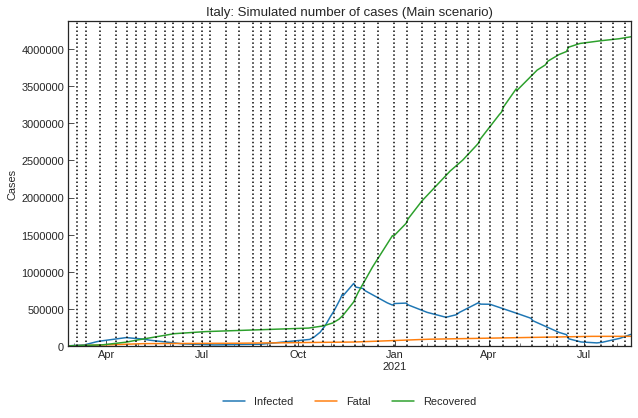

,Date,Infected,Fatal,Recovered
532,2021-08-09 00:00:00,123972,128369,4152231
533,2021-08-10 00:00:00,128964,128405,4154605
534,2021-08-11 00:00:00,134156,128442,4157075
535,2021-08-12 00:00:00,139556,128481,4159644
536,2021-08-13 00:00:00,145172,128521,4162316
537,2021-08-14 00:00:00,151013,128563,4165096
538,2021-08-15 00:00:00,157087,128607,4167988


In [114]:
ita_scenario.clear()
ita_scenario.add(days=7)
ita_scenario.simulate().tail(7).style.background_gradient(axis=0)

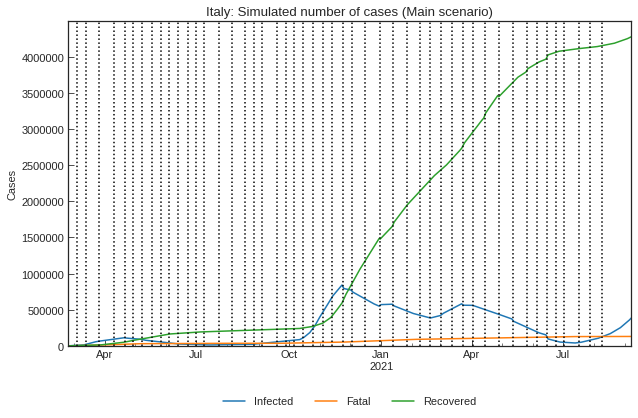

,Date,Infected,Fatal,Recovered
555,2021-09-01 00:00:00,306554,129688,4239364
556,2021-09-02 00:00:00,318806,129777,4245234
557,2021-09-03 00:00:00,331542,129869,4251338
558,2021-09-04 00:00:00,344779,129965,4257686
559,2021-09-05 00:00:00,358537,130065,4264288
560,2021-09-06 00:00:00,372837,130169,4271152
561,2021-09-07 00:00:00,387698,130277,4278291


In [115]:
ita_scenario.clear()
ita_scenario.add(days=30)
ita_scenario.simulate().tail(7).style.background_gradient(axis=0)

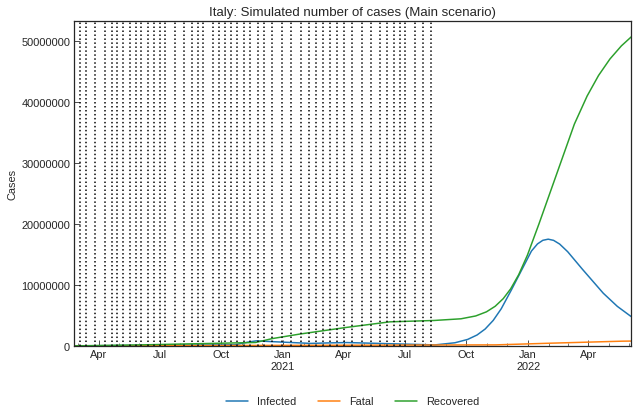

In [116]:
ita_scenario.clear()
ita_scenario.add(days=300)
_ = ita_scenario.simulate()

In [117]:
sigma_before = ita_scenario.get("sigma", name="Main", phase="3rd")
kappa_before = ita_scenario.get("kappa", name="Main", phase="3rd")
(sigma_before, kappa_before)

(0.015576590340494125, 0.00911332164624989)

In [118]:
# Tentative evaluation with clinical study
sigma_med = ita_scenario.get("tau", name="Main", phase="3rd") * (25 / 53) / ((10 + 18) * 1440)
kappa_med = ita_scenario.get("tau", name="Main", phase="3rd") * (7 / 53) / ((10 + 18) * 1440)
(sigma_med, kappa_med)

(0.016846361185983826, 0.0047169811320754715)

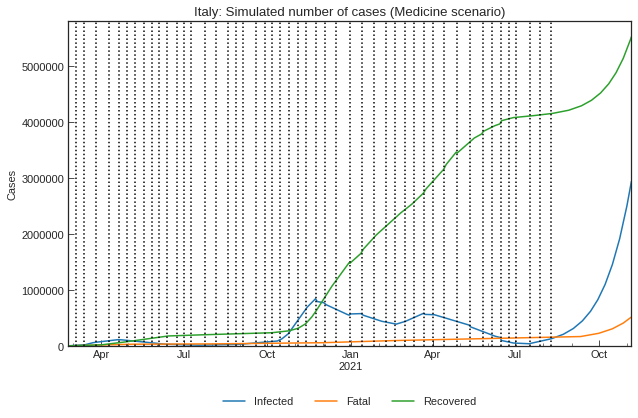

,Date,Infected,Fatal,Recovered
615,2021-10-31 00:00:00,2420726,440331,5257852
616,2021-11-01 00:00:00,2501963,452005,5299315
617,2021-11-02 00:00:00,2585548,464069,5342166
618,2021-11-03 00:00:00,2671526,476536,5386445
619,2021-11-04 00:00:00,2759939,489416,5432192
620,2021-11-05 00:00:00,2850832,502720,5479450
621,2021-11-06 00:00:00,2944247,516462,5528259


In [119]:
ita_scenario.clear(name="Medicine")
ita_scenario.add(days=90, name="Medicine", kappa=kappa_med, sigma=sigma_med)
ita_scenario.simulate(name="Medicine").tail(7).style.background_gradient(axis=0)

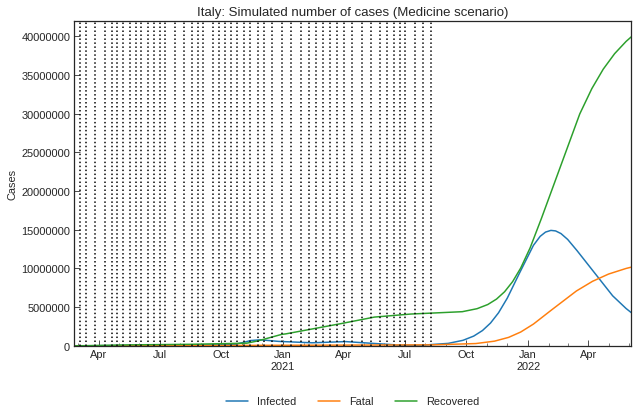

In [120]:
ita_scenario.clear(name="Medicine")
ita_scenario.add(days=300, name="Medicine", kappa=kappa_med, sigma=sigma_med)
_ = ita_scenario.simulate(name="Medicine")

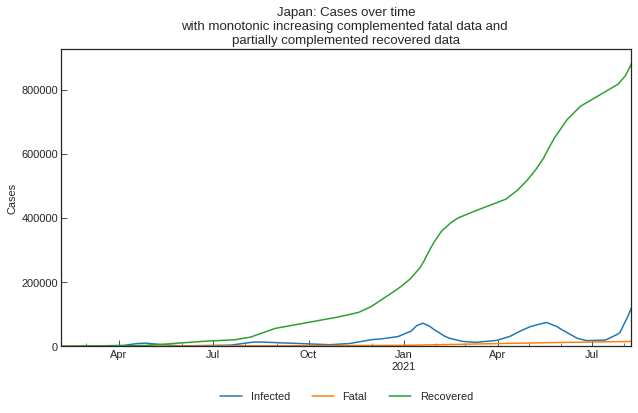

,Date,Infected,Fatal,Recovered
545,2021-08-04,88581,15219,852607
546,2021-08-05,96771,15228,858461
547,2021-08-06,105675,15240,864775
548,2021-08-07,112507,15255,873519
549,2021-08-08,119900,15273,881608


In [121]:
jpn_scenario = cs.Scenario(country="Japan")
jpn_scenario.register(jhu_data)
jpn_scenario.records().tail()

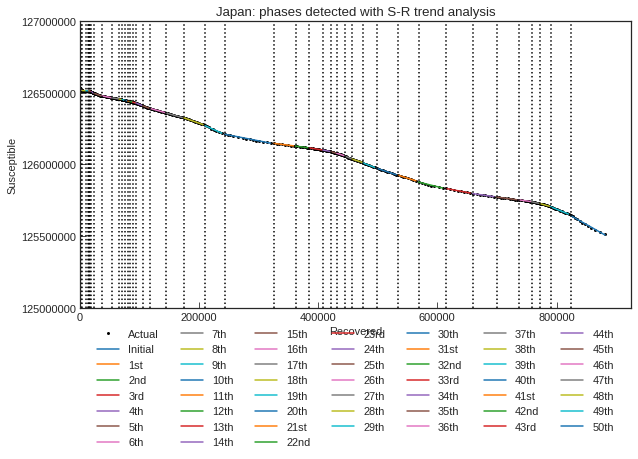

In [122]:
_ = jpn_scenario.trend()


In [123]:
jpn_scenario.summary()

,Type,Start,End,Population
0th,Past,06Feb2020,21Feb2020,126529100
1st,Past,22Feb2020,06Mar2020,126529100
2nd,Past,07Mar2020,14Mar2020,126529100
3rd,Past,15Mar2020,24Mar2020,126529100
4th,Past,25Mar2020,03Apr2020,126529100
5th,Past,04Apr2020,15Apr2020,126529100
6th,Past,16Apr2020,23Apr2020,126529100
7th,Past,24Apr2020,02May2020,126529100
8th,Past,03May2020,13May2020,126529100
9th,Past,14May2020,28May2020,126529100


In [124]:
jpn_scenario.estimate(cs.SIRF, timeout=120)


<SIR-F model: parameter estimation>
Running optimization with 2 CPUs...
	 7th phase (24Apr2020 - 02May2020): finished  146 trials in 0 min  4 sec
	 0th phase (06Feb2020 - 21Feb2020): finished  313 trials in 0 min  9 sec
	 8th phase (03May2020 - 13May2020): finished  339 trials in 0 min 11 sec
	 1st phase (22Feb2020 - 06Mar2020): finished  233 trials in 0 min  7 sec
	 9th phase (14May2020 - 28May2020): finished   80 trials in 0 min  2 sec
	10th phase (29May2020 - 10Jun2020): finished   43 trials in 0 min  1 sec
	 2nd phase (07Mar2020 - 14Mar2020): finished  236 trials in 0 min  7 sec
	11th phase (11Jun2020 - 23Jun2020): finished  208 trials in 0 min  6 sec
	12th phase (24Jun2020 - 03Jul2020): finished  342 trials in 0 min 11 sec
	 3rd phase (15Mar2020 - 24Mar2020): finished  413 trials in 0 min 14 sec
	13th phase (04Jul2020 - 16Jul2020): finished  211 trials in 0 min  6 sec
	 4th phase (25Mar2020 - 03Apr2020): finished  264 trials in 0 min  8 sec
	14th phase (17Jul2020 - 29Jul2020): fi

In [125]:
jpn_scenario.summary()

,Type,Start,End,Population,ODE,Rt,theta,kappa,rho,sigma,tau,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
0th,Past,06Feb2020,21Feb2020,126529100,SIR-F,3.75,0.027669,0.000000,0.077134,0.019992,1440,-,-,-,-,0.204572,313.0,0 min 9 sec
1st,Past,22Feb2020,06Mar2020,126529100,SIR-F,4.24,0.021350,0.000637,0.120571,0.027174,1440,0.021,1569,8,36,0.157440,233.0,0 min 7 sec
2nd,Past,07Mar2020,14Mar2020,126529100,SIR-F,3.66,0.000348,0.004013,0.102885,0.024104,1440,0,249,9,41,0.070662,236.0,0 min 7 sec
3rd,Past,15Mar2020,24Mar2020,126529100,SIR-F,2.25,0.002152,0.002912,0.056745,0.022201,1440,0.002,343,17,45,0.028670,413.0,0 min 14 sec
4th,Past,25Mar2020,03Apr2020,126529100,SIR-F,5.18,0.000071,0.001597,0.116994,0.021004,1440,0,626,8,47,0.039715,264.0,0 min 8 sec
5th,Past,04Apr2020,15Apr2020,126529100,SIR-F,15.66,0.000222,0.000913,0.118038,0.006620,1440,0,1094,8,151,0.025451,366.0,0 min 12 sec
6th,Past,16Apr2020,23Apr2020,126529100,SIR-F,3.62,0.008212,0.001209,0.064717,0.016514,1440,0.008,826,15,60,0.110606,266.0,0 min 8 sec
7th,Past,24Apr2020,02May2020,126529100,SIR-F,1.59,0.011930,0.001246,0.030876,0.017954,1440,0.012,802,32,55,0.028764,146.0,0 min 4 sec
8th,Past,03May2020,13May2020,126529100,SIR-F,0.16,0.044495,0.001383,0.009554,0.054015,1440,0.044,723,104,18,0.093663,339.0,0 min 11 sec
9th,Past,14May2020,28May2020,126529100,SIR-F,0.16,0.054619,0.002886,0.015401,0.086242,1440,0.055,346,64,11,0.024578,80.0,0 min 2 sec


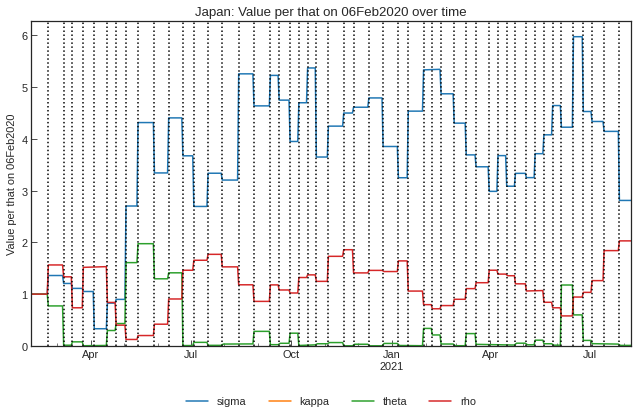

In [126]:
_ = jpn_scenario.history_rate()

In [127]:
sigma2 = jpn_scenario.get("sigma", name="Main", phase="2nd")
sigma1 = jpn_scenario.get("sigma", name="Main", phase="1st")
sigma2 / sigma1

0.8870511028754323

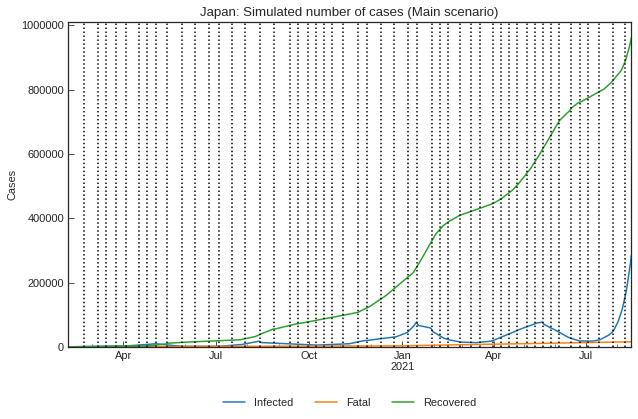

,Date,Infected,Fatal,Recovered
550,2021-08-09 00:00:00,158303,15396,888971
551,2021-08-10 00:00:00,174731,15431,898316
552,2021-08-11 00:00:00,192858,15469,908631
553,2021-08-12 00:00:00,212857,15512,920016
554,2021-08-13 00:00:00,234920,15559,932581
555,2021-08-14 00:00:00,259259,15611,946448
556,2021-08-15 00:00:00,286105,15668,961752


In [128]:
jpn_scenario.clear()
jpn_scenario.add(days=7)
jpn_scenario.simulate().tail(7).style.background_gradient(axis=0)

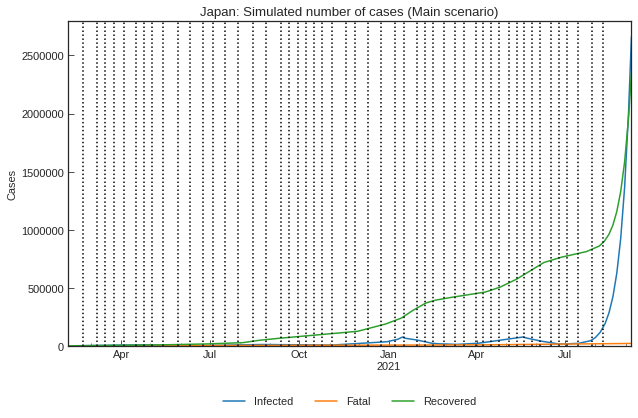

,Date,Infected,Fatal,Recovered
573,2021-09-01 00:00:00,1503337,18291,1664179
574,2021-09-02 00:00:00,1655019,18622,1752908
575,2021-09-03 00:00:00,1821451,18986,1850612
576,2021-09-04 00:00:00,2003895,19386,1958125
577,2021-09-05 00:00:00,2203679,19826,2076332
578,2021-09-06 00:00:00,2422218,20310,2206182
579,2021-09-07 00:00:00,2661185,20840,2348843


In [129]:
jpn_scenario.clear()
jpn_scenario.add(days=30)
jpn_scenario.simulate().tail(7).style.background_gradient(axis=0)

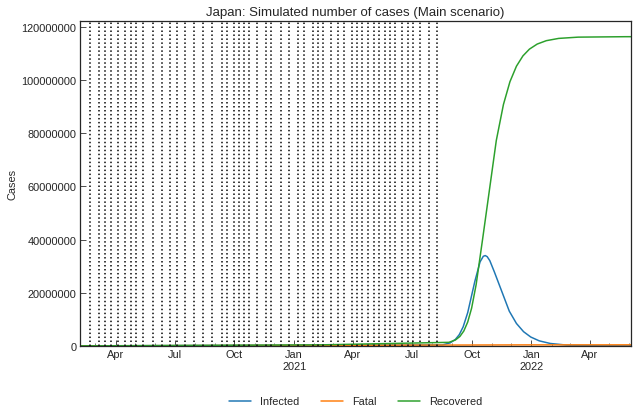

In [130]:
jpn_scenario.clear()
jpn_scenario.add(days=300)
_ = jpn_scenario.simulate()

In [131]:
df = jhu_data.subset("Japan")
population_jpn = int(df.set_index("Date").sum(axis=1).median())
1 - df.loc[df.index[-1], "Confirmed"] / population_jpn

0.9919707392730925

In [132]:
jpn_scenario.get("Rt", name="Main", phase="2nd")

3.66

In [133]:
jpn_scenario.clear()
jpn_scenario.add(days=1000)
df = jpn_scenario.simulate(show_figure=False)
df.loc[df["Infected"].idxmax(), "Date"]

Timestamp('2021-10-22 00:00:00')

In [134]:
current_rho = jpn_scenario.get("rho", name="Main", phase="last")
limit_rho = current_rho / jpn_scenario.get("Rt", name="Main", phase="last") * 1.0
limit_rho

0.056275191313547655

In [135]:
jpn_tau = jpn_scenario.get("tau", name="Main", phase="last")
beta_inv = math.ceil(jpn_tau / 24 / 60 / limit_rho) + 1
target_rho = jpn_tau / 24 / 60 / beta_inv
target_rho

0.05263157894736842

In [136]:
target_rho < limit_rho

True

In [137]:
jpn_scenario.clear()
jpn_scenario.add(days=60, rho=target_rho)
jpn_scenario.summary()

,Type,Start,End,Population,ODE,Rt,theta,kappa,rho,sigma,tau,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
0th,Past,06Feb2020,21Feb2020,126529100,SIR-F,3.75,0.027669,0.000000,0.077134,0.019992,1440,-,-,-,-,0.204572,313,0 min 9 sec
1st,Past,22Feb2020,06Mar2020,126529100,SIR-F,4.24,0.021350,0.000637,0.120571,0.027174,1440,0.021,1569,8,36,0.15744,233,0 min 7 sec
2nd,Past,07Mar2020,14Mar2020,126529100,SIR-F,3.66,0.000348,0.004013,0.102885,0.024104,1440,0,249,9,41,0.0706618,236,0 min 7 sec
3rd,Past,15Mar2020,24Mar2020,126529100,SIR-F,2.25,0.002152,0.002912,0.056745,0.022201,1440,0.002,343,17,45,0.0286701,413,0 min 14 sec
4th,Past,25Mar2020,03Apr2020,126529100,SIR-F,5.18,0.000071,0.001597,0.116994,0.021004,1440,0,626,8,47,0.0397151,264,0 min 8 sec
5th,Past,04Apr2020,15Apr2020,126529100,SIR-F,15.66,0.000222,0.000913,0.118038,0.006620,1440,0,1094,8,151,0.0254508,366,0 min 12 sec
6th,Past,16Apr2020,23Apr2020,126529100,SIR-F,3.62,0.008212,0.001209,0.064717,0.016514,1440,0.008,826,15,60,0.110606,266,0 min 8 sec
7th,Past,24Apr2020,02May2020,126529100,SIR-F,1.59,0.011930,0.001246,0.030876,0.017954,1440,0.012,802,32,55,0.0287637,146,0 min 4 sec
8th,Past,03May2020,13May2020,126529100,SIR-F,0.16,0.044495,0.001383,0.009554,0.054015,1440,0.044,723,104,18,0.0936627,339,0 min 11 sec
9th,Past,14May2020,28May2020,126529100,SIR-F,0.16,0.054619,0.002886,0.015401,0.086242,1440,0.055,346,64,11,0.0245775,80,0 min 2 sec


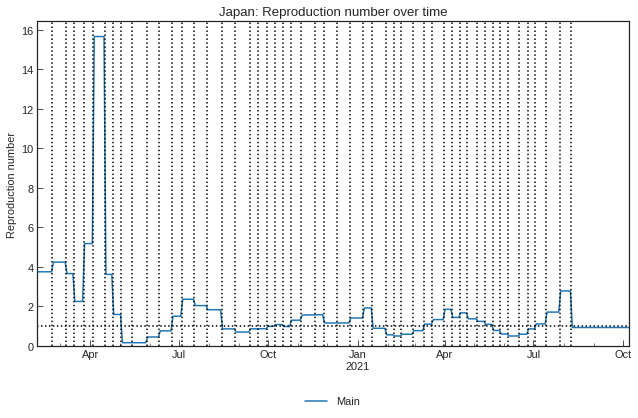

In [138]:
_ = jpn_scenario.history("Rt")

In [139]:
jpn_scenario.clear()
jpn_scenario.add(days=100, rho=target_rho)
df = jpn_scenario.simulate(show_figure=False)
df.loc[df["Infected"].idxmax(), "Date"]

Timestamp('2021-08-08 00:00:00')

In [140]:
target_rho / jpn_scenario.get("rho", name="Main", phase="last")

1.0

In [141]:
remote_rate = round(0.056 * 23992701 / (2651272 + 2128322 + 7928268), 3)
remote_rate

0.106

In [142]:
df = go_out("Japan")
df["School"] = 0
df["Remote"] = df["Office"] * remote_rate
df["Workplace"] = df["Office"] - df["Remote"]
df["Others_CC"] = df["Others"] * 0.75 * (1 - 0.25)
df["Others"] = df["Others"] - df["Others_CC"]
df = pd.concat([df["Portion"], df.loc[:, ~df.columns.isin(["Portion"])]], axis=1)
df = df.drop("Office", axis=1)
jpn_go_df = df.copy()
jpn_go_df

Retrieving population pyramid dataset (Japan) from https://data.worldbank.org/


,Portion,Age_first,Age_last,Period_of_life,School,Others,Age,Population,Remote,Workplace,Others_CC
0,0.026012,0,2,nursery,0,0.0000,2,2852568,0.000,0.000,0.0000
1,0.027143,3,5,nursery school,0,0.4375,5,2976538,0.000,0.000,0.5625
2,0.049302,6,10,elementary school,0,0.4375,10,5406573,0.000,0.000,0.5625
3,0.030291,11,13,middle school,0,0.4375,13,3321807,0.000,0.000,0.5625
4,0.051487,14,18,high school,0,0.4375,18,5646281,0.000,0.000,0.5625
5,0.075915,19,25,university/work,0,0.4375,25,8325118,0.318,2.682,0.5625
6,0.120151,26,35,work,0,0.4375,35,13176170,0.636,5.364,0.5625
7,0.150623,36,45,work,0,0.4375,45,16517812,0.530,4.470,0.5625
8,0.165475,46,55,work,0,0.4375,55,18146550,0.530,4.470,0.5625
9,0.140429,56,65,work,0,0.4375,65,15399883,0.530,4.470,0.5625


In [143]:
df = jpn_go_df.copy()
p_before = (df[["School", "Workplace", "Others_CC"]].sum(axis=1) * df["Portion"]).sum() / 7
p_before

0.5211640508321245

In [144]:
def calc_target_p(rho_before, rho_after, p_before):
    return (rho_before / rho_after * (1 + 9 * p_before) - 1) / 9

In [145]:
rho_last = jpn_scenario.get("rho", name="Main", phase="last")
target_p = calc_target_p(target_rho, rho_last, p_before)
target_p

0.5211640508321245